In [2]:
import time
import os
import math
import cv2
import numpy as np
import pandas as pd
import pyautogui as pa
import shutil
import imageio
from PIL import Image, ImageDraw
import random
from scipy.stats import norm, kstest, sem, ttest_ind, linregress

from lib.analysis.trace_metrics import TraceMetrics
from lib.analysis.false_discovery_control import false_discovery_control
from lib.auto_GUI.auto_PhotoZ import AutoPhotoZ
from lib.analysis.laminar_dist import *
from lib.file.TIF import *
from lib.analysis.align import ImageAlign
from lib.utilities import *
from lib.file.ROI_writer import ROIFileWriter
from lib.file.ROI_reader import ROIFileReader
from lib.analysis.barrel_roi import Barrel_ROI_Creator
from lib.analysis.cell_roi import RandomROISample, OverlapCounterROI

In [3]:
# load trace files from the following directory
data_dir = "C:/Users/jjudge3/Desktop/Data/mm_full_pipeline_targets/current_NBQX_theta/10-23-24/"
nbqx_export_summary = data_dir + "export_summary_backup.csv"

output_fig_dir = 'P:/John/crossing-paper/input/'
camera_program = 4
um_per_px = 6.0 #um

In [4]:
# load CSV of all L4 and L2/3 crossing with NBQX blockade (array only CSV)
crossing_data_dir = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/'
crossing_data = pd.read_csv(crossing_data_dir + 'export_summary_crossing_PPR_array_only.csv')

def read_array_file(filename): 
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=None,
                                 names=['Index',  'Values'])
    return np.array(data_arr['Values']).reshape((80, 80))

def read_dat_trace_file(filename):
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=0)  # change me to traces?
    data_arr = data_arr.apply(pd.to_numeric, errors='coerce')
    return data_arr

crossing_data

,Layer,drug,Date,Slice,Location,Recording,amp_array,ROI file,snr_array
0,L4,ACSF,12/9/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
1,L4,NBQX,12/9/2024,2,3,3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
2,L4,ACSF,10/29/2024,1,1,3,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
3,L4,NBQX,10/29/2024,1,2,1,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
4,L2/3,ACSF,10/23/2024,1,2,3,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
5,L2/3,NBQX,10/23/2024,1,2,4,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
6,L2/3,ACSF,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
7,L2/3,NBQX,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
8,L2/3,ACSF,7/1/2024,3,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
9,L2/3,NBQX,7/1/2024,3,2,5,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...


In [5]:
# read in hw/lat/amp data
data_dir = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/'
hw_lat_data = data_dir + 'export_summary_hw_latency_amp.csv'
hw_lat_df = pd.read_csv(hw_lat_data)
hw_lat_df['latency'] -= 48.6
hw_lat_df

nbqx_export_sagittal = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/sagittal_L4_NBQX/' + "export_summary_backup.csv"
hw_lat_sagittal_df = pd.read_csv(nbqx_export_sagittal)
hw_lat_sagittal_df

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,amp_array,snr_array,Rostral/Caudal,Layer,drug
0,1,2.101260,66.64650,51.0524,5.84029,63.780875,33.171206,27.688716,1_rois,1/15/2025,1,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,ACSF
1,2,1.138650,30.75740,51.7941,8.86817,182.778555,57.975089,52.832740,1_rois,1/15/2025,1,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal,L4,ACSF
2,1,1.863310,47.13760,51.6354,7.20305,63.780875,33.171206,27.688716,1_rois,1/15/2025,1,4,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,NBQX
3,2,0.446560,9.51275,52.0617,18.19140,182.778555,57.975089,52.832740,1_rois,1/15/2025,1,4,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal,L4,NBQX
4,1,22.877600,55.88170,52.6757,12.79720,24.000000,60.593750,37.625000,2_rois,1/15/2025,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,ACSF
5,2,4.549810,13.30700,54.6543,20.84750,115.256236,34.826211,47.700855,2_rois,1/15/2025,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Rostral,L4,ACSF
6,1,17.931500,49.08750,52.5286,9.55607,24.000000,60.593750,37.625000,2_rois,1/15/2025,2,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,NBQX
7,2,1.360260,5.49498,54.6159,6.92785,115.256236,34.826211,47.700855,2_rois,1/15/2025,2,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Rostral,L4,NBQX
8,1,48.319700,53.74320,49.8735,8.69107,43.266615,55.612069,49.232759,3_rois,1/15/2025,3,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,ACSF
9,2,7.034680,37.30910,53.1874,21.11320,201.603571,36.433333,14.062963,3_rois,1/15/2025,3,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal,L4,ACSF


In [6]:
hw_lat_df['Section'] = 'Coronal'
hw_lat_sagittal_df['Section'] = 'Sagittal'

# merge the two hw_lat dataframes
hw_lat_df = pd.concat([hw_lat_df, hw_lat_sagittal_df], ignore_index=True)
hw_lat_df

,Layer,drug,ROI,amp,snr,latency,halfwidth,X_Center,Y_Center,ROI_Set,...,Slice,Location,Recording,Medial/Lateral,trace,Section,Stim_Distance,amp_array,snr_array,Rostral/Caudal
0,L4,ACSF,1,1.208980,44.28930,1.1323,8.08166,50.551020,51.918367,1_rois,...,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
1,L4,ACSF,2,0.330953,6.90515,3.4924,26.12920,66.867374,28.713528,1_rois,...,1,1,1,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
2,L4,NBQX,1,1.774300,75.77820,1.2188,4.78006,50.551020,51.918367,1_rois,...,1,1,2,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
3,L4,NBQX,2,0.325975,7.08423,2.3590,5.69864,66.867374,28.713528,1_rois,...,1,1,2,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
4,L4,ACSF,1,1.488840,68.13480,1.6920,6.25805,55.466877,41.141956,1_rois,...,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,L4,NBQX,2,1.760250,8.24925,52.0891,8.36272,54.714286,45.108466,1_rois,...,1,4,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,180.000000,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal
100,L4,ACSF,1,23.183700,82.01480,52.2659,21.09000,58.769737,10.532895,2_rois,...,2,2,12,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,42.426407,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home
101,L4,ACSF,2,7.614200,15.49940,52.6995,NaN,46.979900,37.638191,2_rois,...,2,2,12,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,113.841996,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Rostral
102,L4,NBQX,1,11.954700,22.43890,51.6497,15.57760,58.769737,10.532895,2_rois,...,2,3,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,42.426407,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home


In [7]:
# read in hw/lat/amp data
data_dir = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/'
hw_lat_data = data_dir + 'export_summary_hw_latency_amp.csv'
hw_lat_df = pd.read_csv(hw_lat_data)
hw_lat_df['latency'] -= 48.6
hw_lat_df

,Layer,drug,ROI,amp,snr,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,Medial/Lateral,trace
0,L4,ACSF,1,1.208980,44.28930,1.1323,8.08166,50.551020,51.918367,1_rois,11/6/2024,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
1,L4,ACSF,2,0.330953,6.90515,3.4924,26.12920,66.867374,28.713528,1_rois,11/6/2024,1,1,1,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
2,L4,NBQX,1,1.774300,75.77820,1.2188,4.78006,50.551020,51.918367,1_rois,11/6/2024,1,1,2,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
3,L4,NBQX,2,0.325975,7.08423,2.3590,5.69864,66.867374,28.713528,1_rois,11/6/2024,1,1,2,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
4,L4,ACSF,1,1.488840,68.13480,1.6920,6.25805,55.466877,41.141956,1_rois,12/9/2024,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
5,L4,ACSF,2,0.983708,39.26490,4.9494,12.78330,29.060606,33.034091,1_rois,12/9/2024,1,1,1,Medial,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
6,L4,NBQX,1,0.000000,0.00000,NaN,6.25805,55.466877,41.141956,1_rois,12/9/2024,1,3,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
7,L4,NBQX,2,0.053680,1.00786,5.2739,2.54030,29.060606,33.034091,1_rois,12/9/2024,1,3,1,Medial,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
8,L4,ACSF,1,14.255900,56.77760,1.5938,8.15259,40.464912,49.561404,2_rois,12/9/2024,2,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
9,L4,ACSF,2,3.041910,23.21550,2.3892,15.21730,51.851974,29.101974,2_rois,12/9/2024,2,1,1,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...


c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


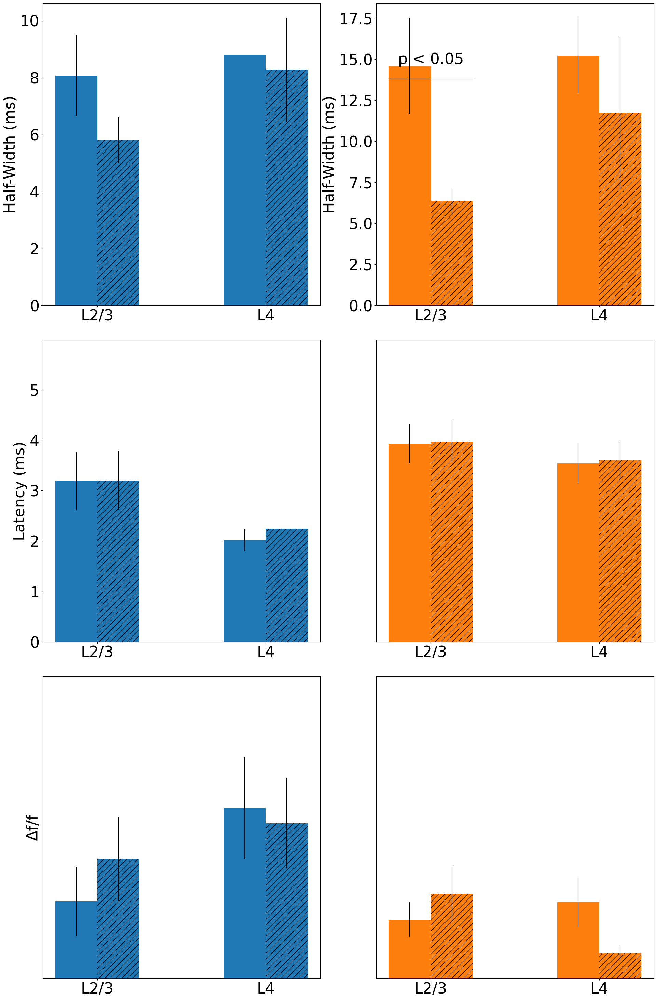

In [8]:
# plot the data, comparing L2/3 to L4 and ACSF to NBQX and home (ROI == 1) to neighbor (ROI > 1)

# font size
plt.rcParams.update({'font.size': 32})

fig, ax = plt.subplots(3, 2, figsize=(20, 30))
layers = ['L2/3', 'L4']
drug = ['ACSF', 'NBQX']

handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        
        hatch = '//' if d == 'NBQX' else None
        for roi in [1, 2]:
            col = 'tab:blue' if roi == 1 else 'tab:orange'
            roi_df = hw_lat_df[(hw_lat_df['Layer'] == layer) & (hw_lat_df['drug'] == d) & (hw_lat_df['ROI'] == roi)]
            l = ax[0][roi-1].bar([i + j/4-.125], np.mean(roi_df['halfwidth']), yerr=sem(roi_df['halfwidth']), label=drug, width=.25, color=col, hatch=hatch)
            ax[1][roi-1].bar([i + j/4-.125], np.mean(roi_df['latency']), yerr=sem(roi_df['latency']), label=drug, width=.25, color=col, hatch=hatch)
            ax[2][roi-1].bar([i + j/4-.125], np.mean(roi_df['amp']), yerr=sem(roi_df['amp']), label=drug, width=.25, color=col, hatch=hatch)
            handles.append(l)
        
ax[0][0].set_ylabel('Half-Width (ms)')
ax[1][0].set_ylabel('Latency (ms)')
ax[2][0].set_ylabel('Δf/f')

for i in range(2):
    for j in range(3):
        ax[j][i].set_xticks([0, 1])
        ax[j][i].set_xticklabels(layers)

# autoscale y-axis for each pair of subplots togethere
for i in range(1,3):
    y_max = max(ax[i][0].get_ylim()[1], ax[i][1].get_ylim()[1]) * 1.3
    ax[i][0].set_ylim(0, y_max)
    ax[i][1].set_ylim(0, y_max)
    ax[i][1].set_yticks([])
ax[2][0].set_yticks([])

# significance testing
for i, layer in enumerate(layers):
    for roi in [1, 2]:
        for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
            t_stat, p_val = ttest_ind(hw_lat_df[(hw_lat_df['Layer'] == layer) & (hw_lat_df['drug'] == 'ACSF') & (hw_lat_df['ROI'] == roi)][metric],
                                      hw_lat_df[(hw_lat_df['Layer'] == layer) & (hw_lat_df['drug'] == 'NBQX') & (hw_lat_df['ROI'] == roi)][metric])
            if p_val < 0.05:
                ax[j][roi-1].text((i), ax[j][roi-1].get_ylim()[1] * 0.8, 'p < 0.05', ha='center')

                # draw bar between ACSF and NBQX
                ax[j][roi-1].plot([i -.25, i + .25], [ax[j][roi-1].get_ylim()[1] * 0.75, ax[j][roi-1].get_ylim()[1] * 0.75], color='black')
            #else:
            #    ax[j][roi-1].text((i + .125), ax[j][roi-1].get_ylim()[1] * 0.8, str(p_val)[:5], ha='center')

handles = [handles[1], handles[3]]
#ax[0][1].legend(handles=handles, labels=['ACSF', '+NBQX'], loc='upper left')
ax[0][1].set_ylabel('Half-Width (ms)')
#ax[0][0].set_title('Home Barrel')
#ax[0][1].set_title('Neighbor Barrel')
plt.tight_layout()
plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/hw_lat_amp.png')
plt.show()


In [9]:
# velocity analysis 
# read in velocity ladders
ladder_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/export_summary_ladders.csv'
ladder_df = pd.read_csv(ladder_csv)
ladder_df['latency'] -= 48.6

# fold in some more ladder data from PPR_ladder directory 
ladder_csv_2 = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_ladder/export_summary_ladder_backup.csv'
ladder_df_2 = pd.read_csv(ladder_csv_2)
ladder_df_2['latency'] -= 48.6  # some of the data is stimulated at a different time point, but deltas are the same

# format m-d-yy to m/d/yyyy in ladder_df_2
ladder_df_2['Date'] = pd.to_datetime(ladder_df_2['Date'], format='%m-%d-%y').dt.strftime('%#m/%#d/%Y')

# before merging, remove any rows that are in both dataframes from the second dataframe (match on date/slice alone)
for row in ladder_df_2.iterrows():
    date = row[1]['Date']
    slic = row[1]['Slice']
    #print(f"Checking {date} {slic} in ladder_df_2")
    if len(ladder_df[(ladder_df['Date'] == date) & (ladder_df['Slice'] == slic)]) > 0:
        ladder_df_2.drop(row[0], inplace=True)
        print(f"Removing {date} {slic} from ladder_df_2")

# merge the two dataframes
ladder_df = pd.concat([ladder_df, ladder_df_2], ignore_index=True)

# add a new column Dist_from_home_barrel
ladder_df['Dist_from_home_barrel'] = np.nan

# add a new column resides_in_barrel
ladder_df['resides_in_barrel'] = np.nan

# and for velocity
ladder_df['instantaneous_velocity'] = np.nan

ladder_df

Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 3 from ladder_df_2
Removing 12/11/2024 3 fro

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity
0,1,0.408552,19.7128,3.9030,16.6507,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN
1,2,0.462050,27.5393,3.9159,14.4435,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN
2,3,0.441868,28.2700,3.8743,13.6368,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN
3,4,0.466602,22.1134,3.8636,13.2221,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN
4,5,0.526346,26.8669,3.7651,10.1029,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,22,10.513800,NaN,32.4017,10.5138,87.361319,68.000000,42.000000,3_rois_output__ladder_ pulse1,4/16/2025,3,2,1,NaN,NaN,NaN,NaN
1425,23,10.499200,NaN,32.5608,10.4992,93.914855,71.000000,42.500000,3_rois_output__ladder_ pulse1,4/16/2025,3,2,1,NaN,NaN,NaN,NaN
1426,24,11.141100,NaN,32.6341,11.1411,103.227903,74.000000,42.500000,3_rois_output__ladder_ pulse1,4/16/2025,3,2,1,NaN,NaN,NaN,NaN
1427,25,10.717900,NaN,32.7312,10.7179,114.629839,77.000000,42.500000,3_rois_output__ladder_ pulse1,4/16/2025,3,2,1,NaN,NaN,NaN,NaN


In [10]:
# also load export_summary_backup_coronal.csv and export_summary_backup_sagittal.csv from C:\Users\jjudge3\Desktop\Data\crossing_PPR\PPR\
coronal_ppr_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/export_summary_backup_coronal.csv'
coronal_ppr_df_ = pd.read_csv(coronal_ppr_csv)

sagittal_ppr_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/export_summary_backup_sagittal.csv'
sagittal_ppr_df_ = pd.read_csv(sagittal_ppr_csv)

# merge the two dataframes
ppr_df_for_roi_lookup = pd.concat([coronal_ppr_df_, sagittal_ppr_df_], ignore_index=True)
# split column 'ROI_Set'
ppr_df_for_roi_lookup['ROI file'] =  ppr_df_for_roi_lookup['ROI_Set'].str.split(' ', expand=True)[0]

# file ROI_File should be located in the same directory as the file named in 'trace'
for row in ppr_df_for_roi_lookup.iterrows():
    # get the trace file name
    trace_file = row[1]['trace']
    # get the directory of the trace file
    trace_dir = os.path.dirname(trace_file)
    # get the ROI file name
    roi_file = row[1]['ROI file'] + '.dat'
    # set the ROI file to be in the same directory as the trace file
    ppr_df_for_roi_lookup.at[row[0], 'ROI file'] = os.path.join(trace_dir, roi_file)

# add Drug and Layer columns to the dataframe
ppr_df_for_roi_lookup['drug'] = 'ACSF'
ppr_df_for_roi_lookup['Layer'] = 'L4'

In [24]:
# re-run from here down to fill in the missing velocity data

    drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
0   ACSF             368.804275          Neighbor                     NaN
1   ACSF             350.406813          Neighbor              422.912185
2   ACSF             332.813666              None             1626.003658
3   ACSF             315.415427          Neighbor              183.157884
4   ACSF             297.374375          Neighbor              139.073187
5   ACSF             279.851153          Neighbor              117.169503
6   ACSF             262.228860              None              102.428724
7   ACSF             244.477962              None              184.949586
8   ACSF             227.111196              Home              363.951400
9   ACSF             209.423158              Home              128.503918
10  ACSF             191.869523              Home              880.865557
11  ACSF             174.604558              None               90.659734
12  ACSF             157.098163       

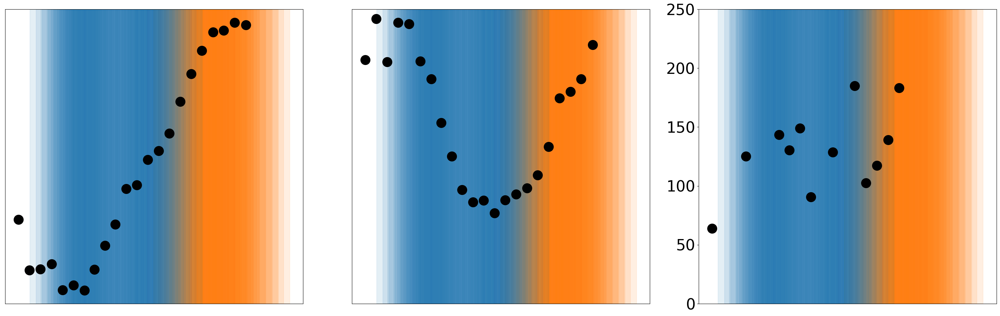

    drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
44  ACSF             432.360313              None              211.638397
45  ACSF             413.968936          Neighbor              101.327378
46  ACSF             396.094787          Neighbor               80.874932
47  ACSF             377.720002          Neighbor               95.330108
48  ACSF             359.836074          Neighbor              158.675077
49  ACSF             342.048598          Neighbor              123.367766
50  ACSF             323.703811          Neighbor              103.289735
51  ACSF             305.783042              None               96.675226
52  ACSF             288.033470          Neighbor              119.284679
53  ACSF             269.651701          Neighbor               82.064643
54  ACSF             251.769816              None               85.696913
55  ACSF             233.970567              None              442.499527
56  ACSF             215.651086       

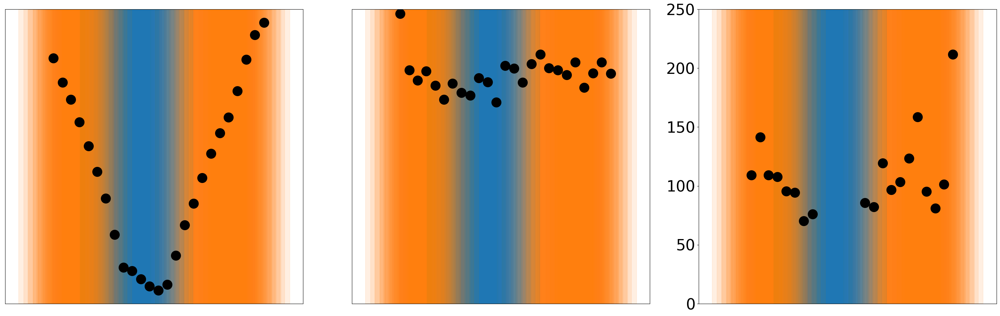

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
94   ACSF             430.110289              Home              486.288839
95   ACSF             412.117602              Home              203.680662
96   ACSF             394.132599              Home              -70.725751
97   ACSF             376.118750              Home              -66.798357
98   ACSF             358.136633              Home             -156.878942
99   ACSF             340.142618              None             -219.163775
100  ACSF             322.149272              None             -144.925003
101  ACSF             304.164079              None             -166.683086
102  ACSF             286.178974          Neighbor             -115.801918
103  ACSF             268.287578          Neighbor             -141.540966
104  ACSF             250.396800          Neighbor             -142.454175
105  ACSF             232.419083          Neighbor             -122.791931
106  ACSF             214

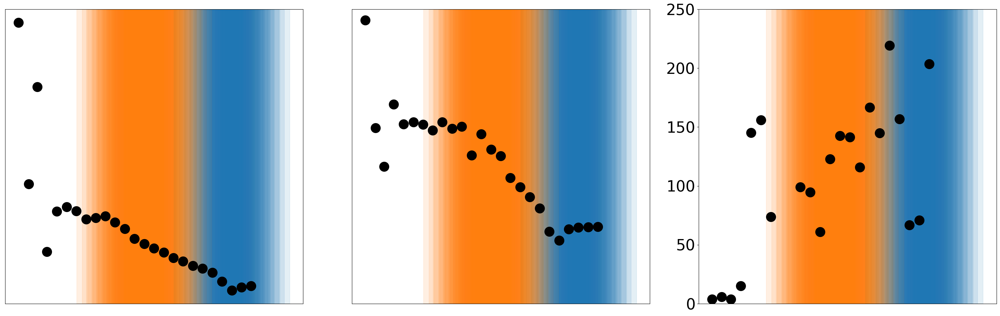

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
144  ACSF             495.611372              None               46.447408
145  ACSF             477.348251              None              128.819407
146  ACSF             459.094541              None              190.126553
147  ACSF             442.211303              None              150.041743
148  ACSF             423.996236              None              250.102233
149  ACSF             405.913844              None               97.035441
150  ACSF             387.603256              None               63.881818
151  ACSF             369.416103              None               50.651101
152  ACSF             352.539156              Home               65.169195
153  ACSF             334.383018              Home              171.558757
154  ACSF             316.369349              Home              109.711715
155  ACSF             299.199465              Home               94.109777
156  ACSF             280

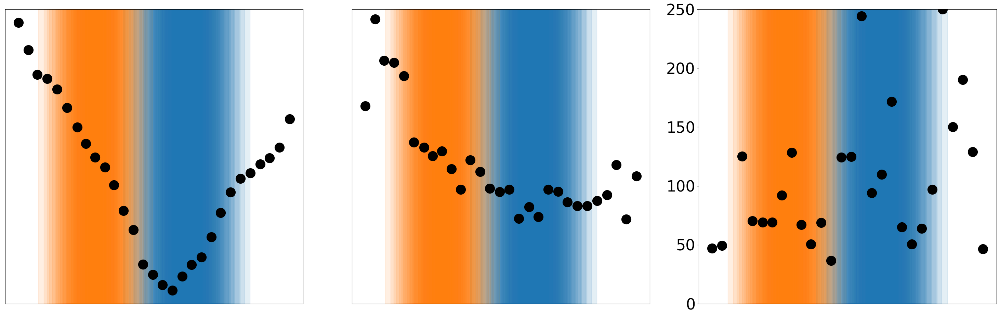

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
202  ACSF             388.536514              None               65.104863
203  ACSF             370.925649              None               44.614970
204  ACSF             352.896740              None              -80.408649
205  ACSF             335.150551              None             -232.437797
206  ACSF             317.043647              None              104.480100
207  ACSF             299.208894              None               90.230783
208  ACSF             281.280037              None              174.489961
209  ACSF             263.708898              None              122.778613
210  ACSF             245.427163          Neighbor              323.697402
211  ACSF             227.979873              None              115.461868
212  ACSF             209.933183          Neighbor               55.630221
213  ACSF             192.226083          Neighbor               58.920040
214  ACSF             174

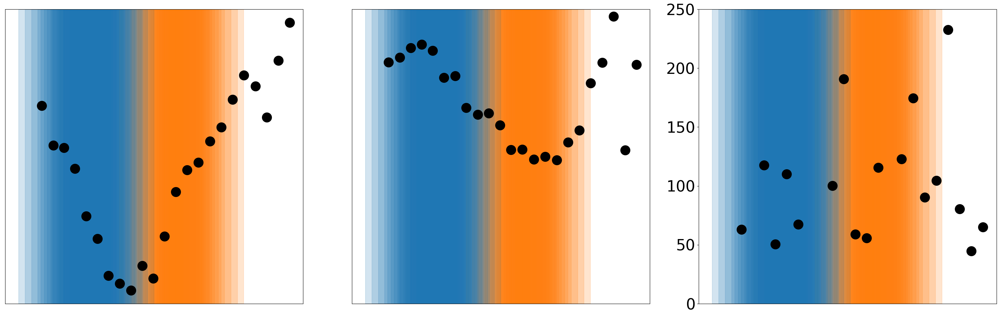

No ROI file found for  11/6/2024 1 1
     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
969  ACSF             435.419753          Neighbor              120.663688
970  ACSF             416.837545              None               92.289429
971  ACSF             399.671712          Neighbor               48.395263
972  ACSF             381.233117          Neighbor               99.778105
973  ACSF             363.771948              None               87.508160
974  ACSF             345.832775              None               81.133978
975  ACSF             328.064434              Home               60.486552
976  ACSF             309.857982              Home              279.467228
977  ACSF             292.531014              Home             -116.238861
978  ACSF             274.513990              Home             -125.098302
979  ACSF             256.875130              Home             -154.048403
980  ACSF             238.851466              Home             

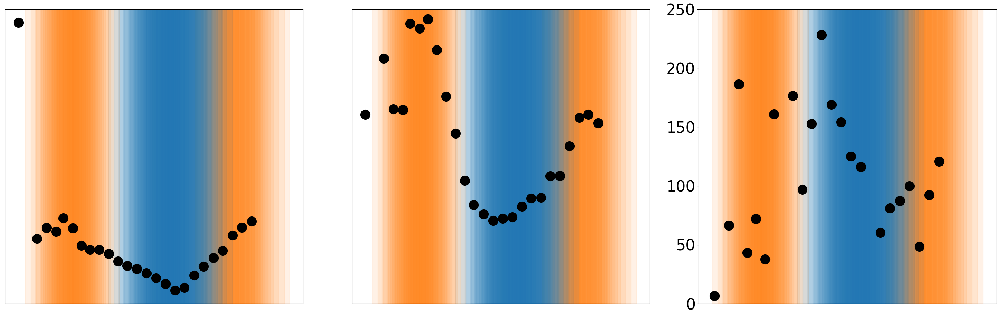

No ROI file found for  12/9/2024 1 1
     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
344  ACSF             507.399931              None               34.576583
345  ACSF             490.066690              None               94.065929
346  ACSF             472.504581          Neighbor                     NaN
347  ACSF             454.125955              None             -237.197565
348  ACSF             436.810533          Neighbor             -782.988696
349  ACSF             418.723494          Neighbor               64.788278
350  ACSF             400.958548          Neighbor               83.585081
351  ACSF             383.330454              None               49.404910
352  ACSF             365.317424              None               72.662501
353  ACSF             347.631371              Home               83.774637
354  ACSF             329.846016              Home               92.051369
355  ACSF             313.479282              Home             

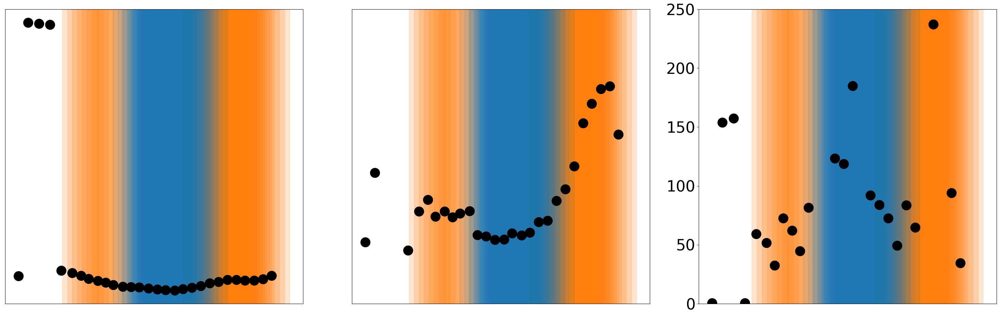

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
402  ACSF             414.010869              None              108.692669
403  ACSF             396.011363              None              101.634438
404  ACSF             378.011905              None              132.836936
405  ACSF             360.012500              None              369.108602
406  ACSF             342.000000              None              218.181818
407  ACSF             324.000000              Home              402.684564
408  ACSF             306.000000              Home                     NaN
409  ACSF             288.000000              None             -248.962656
410  ACSF             270.000000              Home             -117.340287
411  ACSF             252.000000              None              -87.167070
412  ACSF             234.000000              None              -98.306936
413  ACSF             216.000000              None             -137.231099
414  ACSF             198

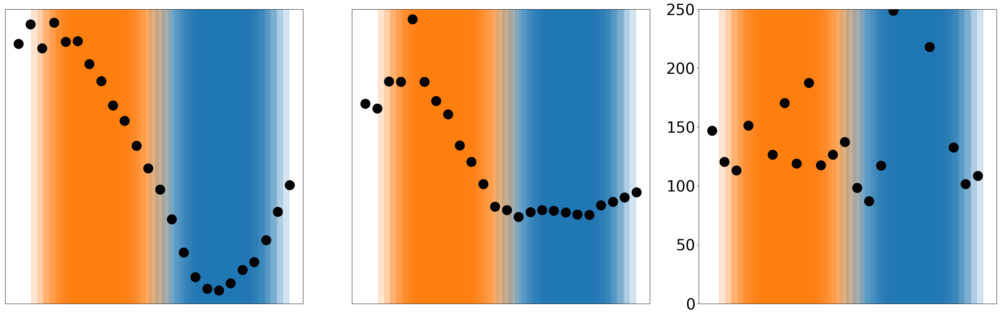

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
450  ACSF             464.397477          Neighbor              380.984401
451  ACSF             446.643604          Neighbor               26.135570
452  ACSF             429.054365          Neighbor               54.011000
453  ACSF             411.484587              None               77.974583
454  ACSF             393.605015              None               54.262410
455  ACSF             375.058123          Neighbor               51.205856
456  ACSF             357.284571              None               48.682065
457  ACSF             339.676268              None               51.339383
458  ACSF             321.851234              None              186.267013
459  ACSF             303.764707              None              202.005624
460  ACSF             286.170017              None              183.449872
461  ACSF             269.017454              Home              266.822798
462  ACSF             250

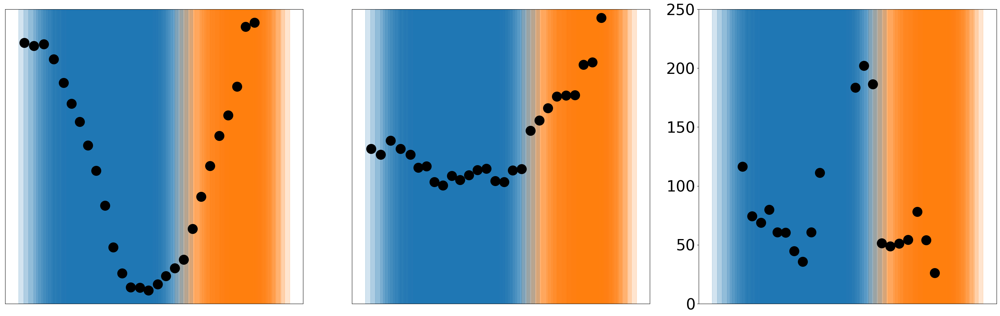

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
994   ACSF             466.927868              Home              107.212071
995   ACSF             448.809027              Home               98.732809
996   ACSF             430.642191              Home              164.593015
997   ACSF             412.866145              Home                     NaN
998   ACSF             394.743427              None               45.435828
999   ACSF             376.569095              Home                     NaN
1000  ACSF             358.610401              Home             -555.686427
1001  ACSF             340.828436              Home              -72.599151
1002  ACSF             322.751247              Home              -52.758614
1003  ACSF             304.971594              None             -150.184010
1004  ACSF             287.099697              None              -45.992745
1005  ACSF             268.932562              None             -112.487272
1006  ACSF  

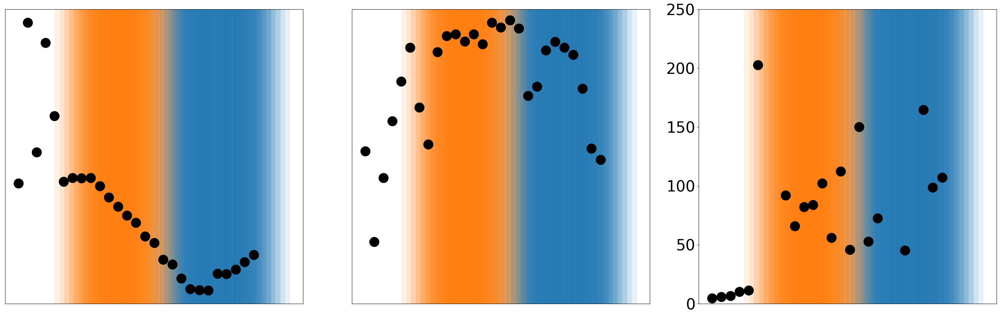

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
504  ACSF             499.134323              None              355.536009
505  ACSF             482.317469              None              290.417201
506  ACSF             463.208018          Neighbor              185.452227
507  ACSF             445.590056          Neighbor              329.282647
508  ACSF             427.249013          Neighbor               86.877526
509  ACSF             410.499026          Neighbor              128.890678
510  ACSF             390.984977          Neighbor              153.372688
511  ACSF             374.543425          Neighbor              934.362409
512  ACSF             355.015250              None               88.240638
513  ACSF             338.973102              None             -153.999343
514  ACSF             320.754980              None              659.720447
515  ACSF             303.404332              Home                     NaN
516  ACSF             286

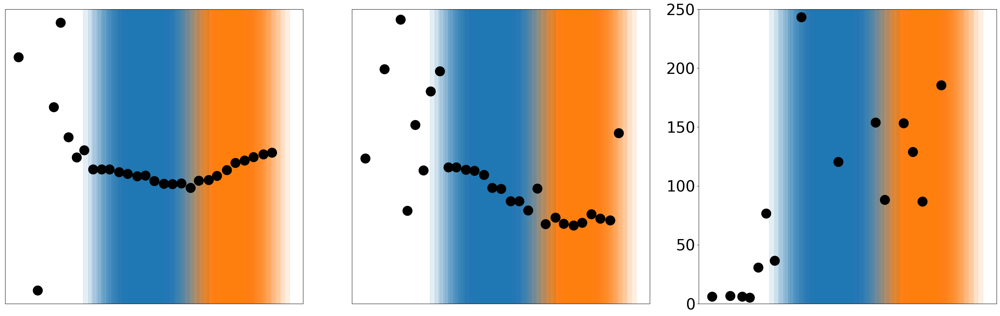

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
560  ACSF             411.098528              None              877.828703
561  ACSF             393.103040              None               88.733015
562  ACSF             375.107984              None               42.697923
563  ACSF             357.012605              None               95.682001
564  ACSF             339.053093              None               88.524463
565  ACSF             321.056070              None               28.006022
566  ACSF             303.059400              None             -214.496415
567  ACSF             285.063151              Home             -512.699250
568  ACSF             267.067407              None              275.576241
569  ACSF             249.072279              None              129.642433
570  ACSF             231.077909              None              123.651908
571  ACSF             213.000000              Home               90.200323
572  ACSF             195

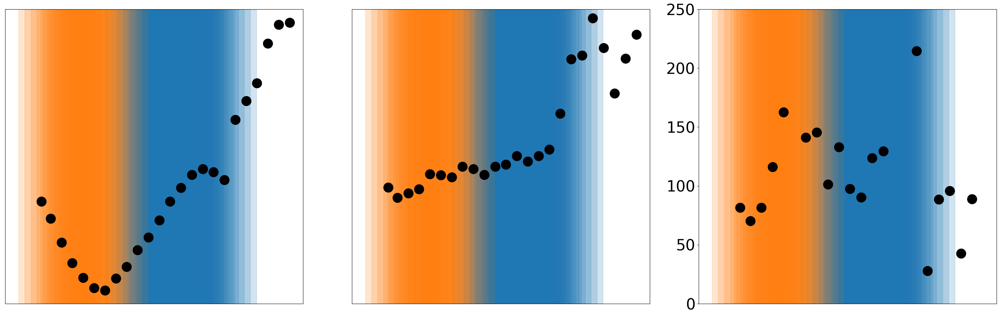

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
608  ACSF             413.649162              None               73.242832
609  ACSF             395.931721              Home               84.992276
610  ACSF             377.947355              Home               81.566168
611  ACSF             360.157774              Home               63.281643
612  ACSF             342.046567              Home               51.040057
613  ACSF             324.284628              Home               57.171078
614  ACSF             306.281455              Home             -604.204352
615  ACSF             288.880370              Home             1394.047472
616  ACSF             270.897158              None             -496.764938
617  ACSF             253.013620              None              -83.465698
618  ACSF             235.243773              None              -70.674240
619  ACSF             217.582280          Neighbor              -75.465092
620  ACSF             199

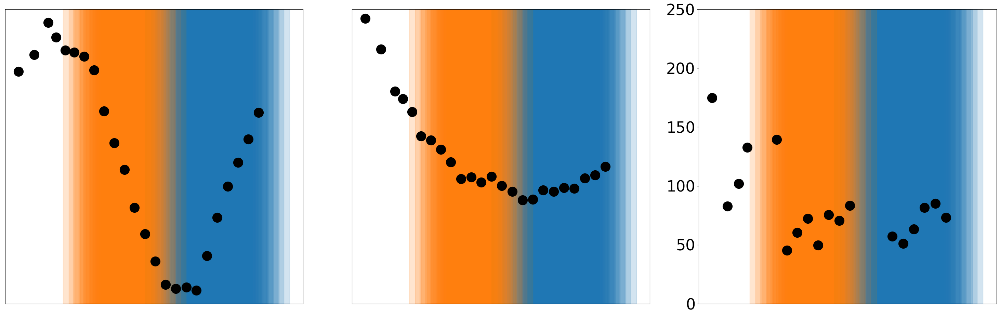

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1021  ACSF             463.639256          Neighbor              276.638170
1022  ACSF             445.104499          Neighbor               58.637869
1023  ACSF             427.161311              None               86.735904
1024  ACSF             409.206979          Neighbor              242.540297
1025  ACSF             391.744078              None              123.090704
1026  ACSF             373.280472              None              102.375287
1027  ACSF             355.671923              None              109.842898
1028  ACSF             337.218316              None               78.906431
1029  ACSF             319.701088              Home               89.876785
1030  ACSF             301.995361              Home               93.299176
1031  ACSF             284.175219              Home              459.703409
1032  ACSF             265.787082              Home             -210.026858
1033  ACSF  

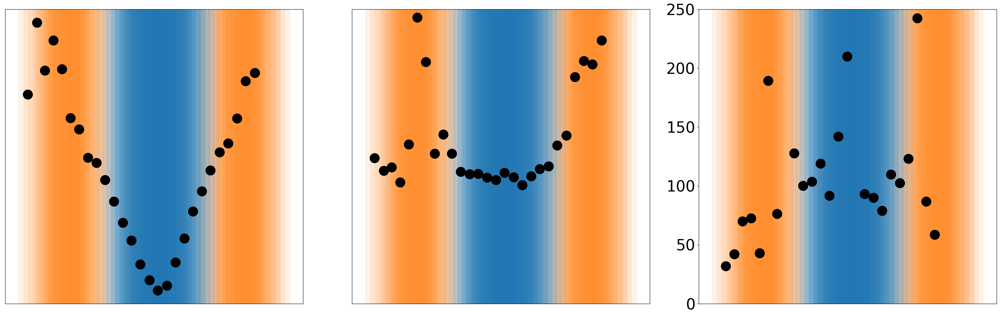

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
656  ACSF             415.288174              None               -1.182643
657  ACSF             397.403184              None             -168.511893
658  ACSF             379.844244              None                2.504684
659  ACSF             361.701063              None               -2.662894
660  ACSF             343.674071              None               49.004508
661  ACSF             325.949141              None              106.850544
662  ACSF             307.699068              None               66.477329
663  ACSF             289.982860              None              546.535121
664  ACSF             271.837894              Home                     NaN
665  ACSF             254.336869              Home               95.555326
666  ACSF             236.143135              None             -310.302622
667  ACSF             218.486916              Home              423.370800
668  ACSF             201

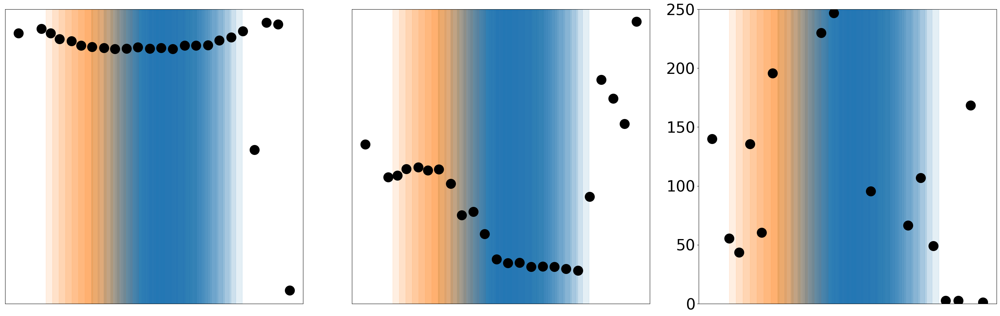

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
704  ACSF             491.367043              None             -152.759681
705  ACSF             474.563864              None              -79.936829
706  ACSF             454.912200              None             -106.888378
707  ACSF             438.791613              None               70.708522
708  ACSF             420.243109              None               35.137982
..    ...                    ...               ...                     ...
811  ACSF              99.448200          Neighbor               74.130072
812  ACSF              82.830732          Neighbor              -26.366625
813  ACSF              67.740267              None               18.089689
814  ACSF              51.298779              None             -112.734470
815  ACSF              35.642295              None              -51.776593

[112 rows x 4 columns]
     ROI       amp       snr  latency  halfwidth  Stim_Distance   X_Center  

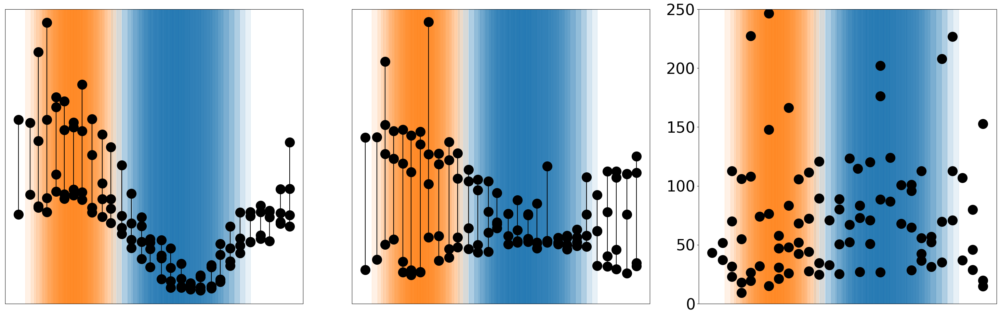

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
816  ACSF             410.364727              None              -61.434747
817  ACSF             392.671520              Home               85.197949
818  ACSF             374.950347              Home               68.462042
819  ACSF             357.013292              None              967.740095
820  ACSF             339.593970              Home              243.384671
821  ACSF             321.340120              Home               86.171008
822  ACSF             303.502721              Home               73.526147
823  ACSF             285.929972              None              163.850099
824  ACSF             268.070311              None              457.082054
825  ACSF             251.158275              None             -166.158496
826  ACSF             233.213158          Neighbor              -50.076915
827  ACSF             215.736314          Neighbor              -76.362948
828  ACSF             198

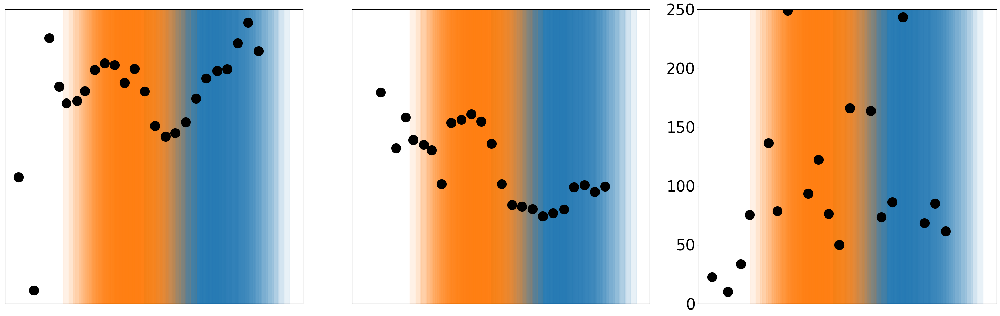

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
840  ACSF             392.159609              None               54.262767
841  ACSF             374.073829              None               52.137405
842  ACSF             356.070783              Home               95.269407
843  ACSF             338.169662              Home              623.620685
844  ACSF             320.458834              Home             -124.613359
845  ACSF             302.813583              Home              -73.675103
846  ACSF             284.917900              Home              -88.109731
847  ACSF             267.014003              Home             -168.806165
848  ACSF             249.221833              None             -141.538560
849  ACSF             231.090743              None              -26.192355
850  ACSF             213.238034              None              -28.036616
851  ACSF             195.482445          Neighbor              -44.005007
852  ACSF             178

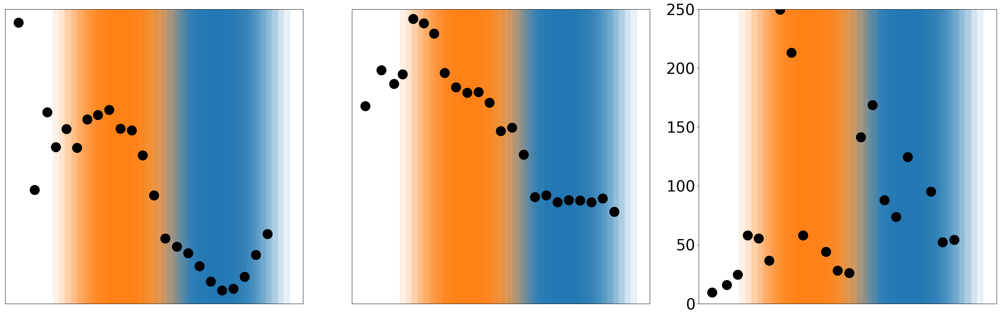

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
863  ACSF             462.354570              None              160.549588
864  ACSF             444.629896          Neighbor              105.483227
865  ACSF             426.739940          Neighbor              111.194832
866  ACSF             408.592944          Neighbor              142.117932
867  ACSF             390.728720          Neighbor               39.869698
868  ACSF             372.743499          Neighbor               77.191567
869  ACSF             354.842774              None              132.897490
870  ACSF             337.260437              Home               58.200065
871  ACSF             319.445397              Home             -212.508150
872  ACSF             301.679715              Home                     NaN
873  ACSF             283.808887              Home              238.949062
874  ACSF             266.150551              Home              -58.818587
875  ACSF             248

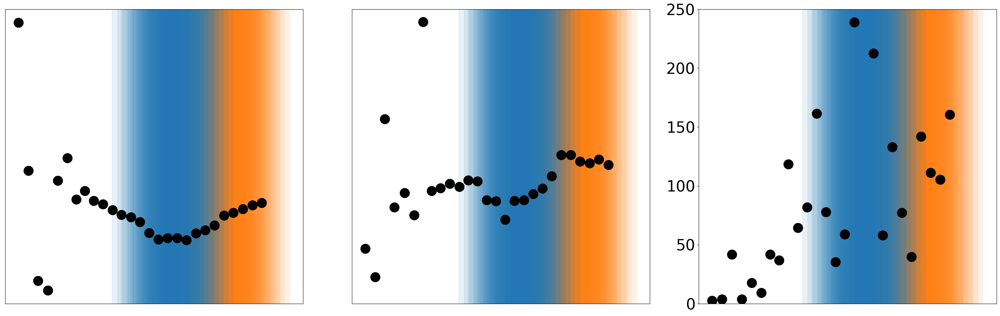

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
890  ACSF             470.905470          Neighbor               28.318103
891  ACSF             452.895157          Neighbor              230.710122
892  ACSF             435.130477          Neighbor               62.757864
893  ACSF             416.993454              None               31.551524
894  ACSF             398.882880              None               45.680315
895  ACSF             381.615721              Home               86.671713
896  ACSF             362.894631              Home             -936.496558
897  ACSF             345.101196              None              -66.649395
898  ACSF             327.305808              Home              -21.848482
899  ACSF             309.805173              Home              -39.880704
900  ACSF             292.855874              None              -38.940916
901  ACSF             274.125294              None              -52.526028
902  ACSF             256

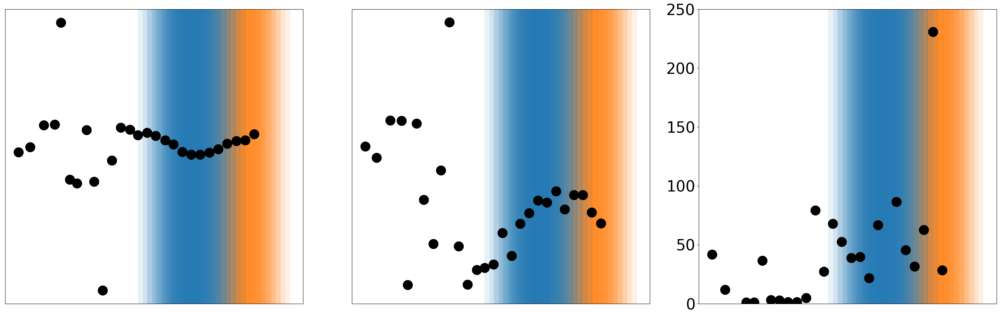

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_18296\74339446.py:198: RuntimeWarning: divide by zero encountered in double_scalars
  velocity = dist / latency_diff


     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
917  ACSF             453.013476              None               -4.363559
918  ACSF             434.446096              None                1.430055
919  ACSF             417.171747              None               -1.368952
920  ACSF             398.664068          Neighbor                7.206873
921  ACSF             380.777329          Neighbor                2.186355
922  ACSF             362.430964          Neighbor               -3.878768
923  ACSF             344.901647          Neighbor               -2.307966
924  ACSF             327.715838              None               -0.423159
925  ACSF             309.207633              None                     NaN
926  ACSF             291.049284              Home                     NaN
927  ACSF             272.736394              Home                     NaN
928  ACSF             256.347359              Home                     NaN
929  ACSF             237

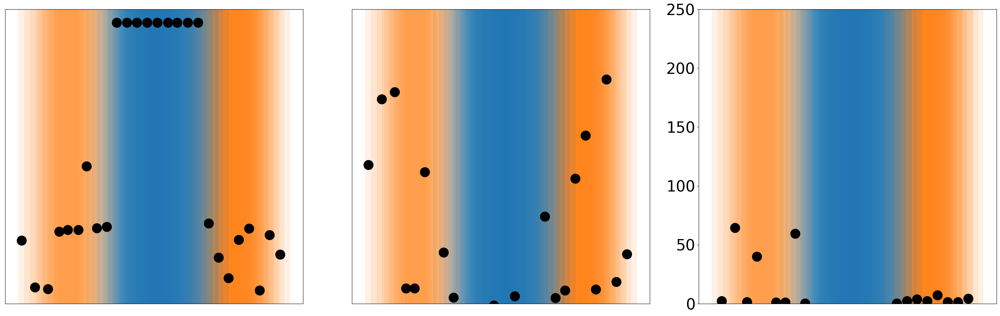

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
943  ACSF             458.705640              None               63.567541
944  ACSF             439.978643              None              -30.844204
945  ACSF             421.373419              None               70.349655
946  ACSF             403.863390              None               62.090582
947  ACSF             385.292097              None               73.391608
948  ACSF             367.333170              None              383.422680
949  ACSF             349.580700              None              127.387996
950  ACSF             332.676313              None               50.186159
951  ACSF             314.885320              Home               49.760326
952  ACSF             296.185389              Home               56.196786
953  ACSF             278.730668              Home             -910.900130
954  ACSF             259.966125              Home              -44.551157
955  ACSF             242

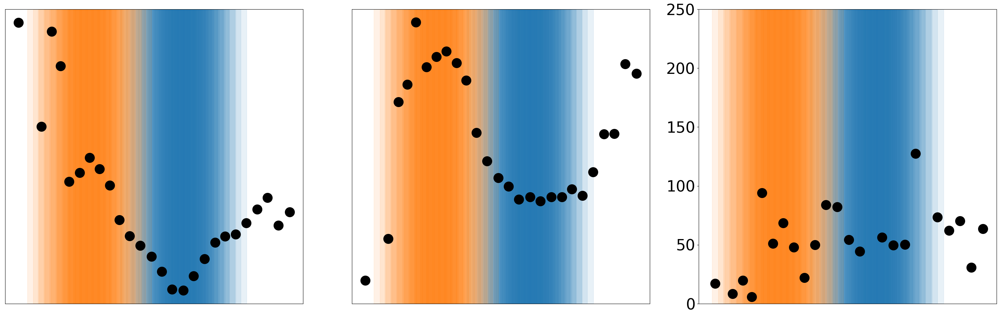

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1048  ACSF             439.063977              None              683.147274
1049  ACSF             421.438778              None              -67.729222
1050  ACSF             403.856272              None              123.426493
1051  ACSF             385.687892              None              275.355560
1052  ACSF             367.183998          Neighbor              164.866120
1053  ACSF             350.351167              None              198.799623
1054  ACSF             332.121242          Neighbor               64.298706
1055  ACSF             313.693233          Neighbor               66.281214
1056  ACSF             296.069058          Neighbor               64.805727
1057  ACSF             277.878090              None              223.002111
1058  ACSF             260.127122              None              222.889367
1059  ACSF             242.362840              None              251.034003
1060  ACSF  

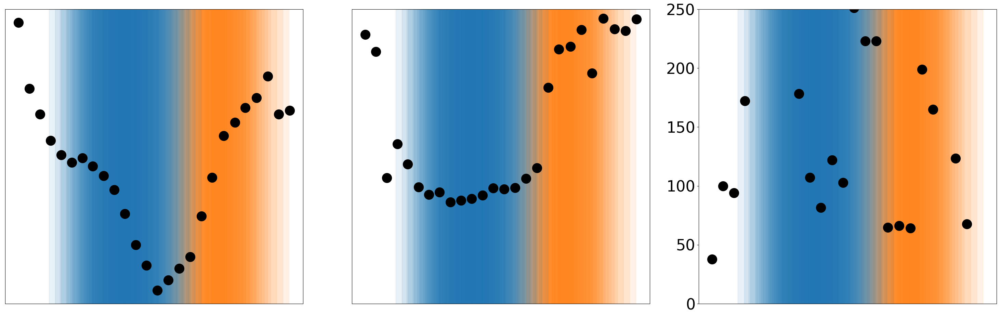

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1074  ACSF             395.166720              None              101.279220
1075  ACSF             377.544136              Home               83.082315
1076  ACSF             359.490349              Home               58.704520
1077  ACSF             341.972920              Home               50.380232
1078  ACSF             324.148394              Home               51.332454
1079  ACSF             306.212835              Home              294.692136
1080  ACSF             288.914406              Home              -74.675330
1081  ACSF             271.477717              None              -56.045843
1082  ACSF             254.473408              None             -106.265182
1083  ACSF             236.387074              None              -69.690609
1084  ACSF             218.790195              None              -62.183464
1085  ACSF             201.409917              None              -67.418648
1086  ACSF  

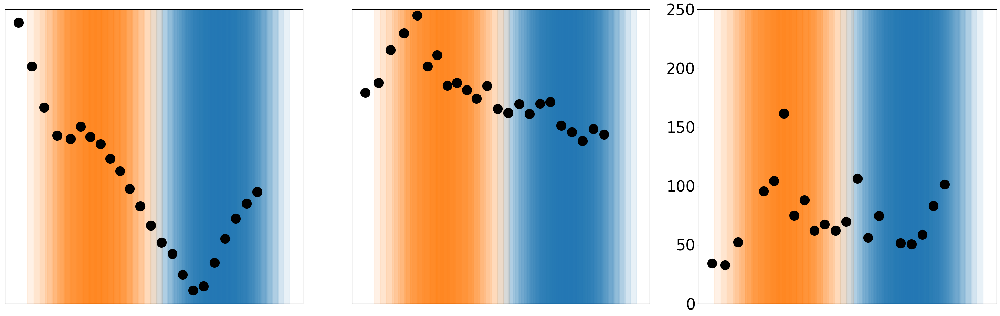

No ROI file found for  1/15/2025 1 1
      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1127  ACSF             430.427419              Home               30.489173
1128  ACSF             412.265019              Home               45.434066
1129  ACSF             394.123196              Home               63.925904
1130  ACSF             376.377365              None              126.343687
1131  ACSF             358.411293              Home              266.580623
1132  ACSF             340.577049              None             2319.458154
1133  ACSF             322.949167              Home             -462.113721
1134  ACSF             305.157789              Home             -148.042894
1135  ACSF             287.466663              Home             -110.294789
1136  ACSF             270.006998              Home              -95.442460
1137  ACSF             251.710678              None              -89.840422
1138  ACSF             234.281637              None

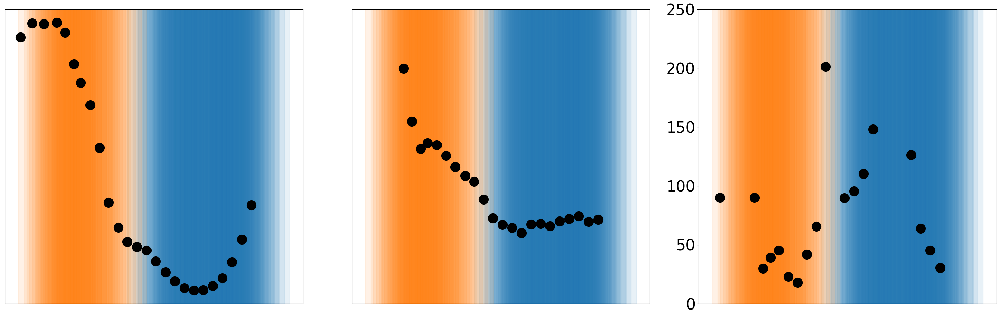

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1152  ACSF             461.671702              None             1158.692912
1153  ACSF             443.248484              None              156.912794
1154  ACSF             425.250587              None             -700.217535
1155  ACSF             408.235301          Neighbor              255.995785
1156  ACSF             389.803604          Neighbor              335.966529
1157  ACSF             372.467731          Neighbor              119.142354
1158  ACSF             353.964924              None              102.612907
1159  ACSF             335.648520          Neighbor              182.800960
1160  ACSF             317.971667          Neighbor              125.565915
1161  ACSF             299.902732              None             -945.081965
1162  ACSF             281.946174              None             -360.217729
1163  ACSF             264.007331              None                     NaN
1164  ACSF  

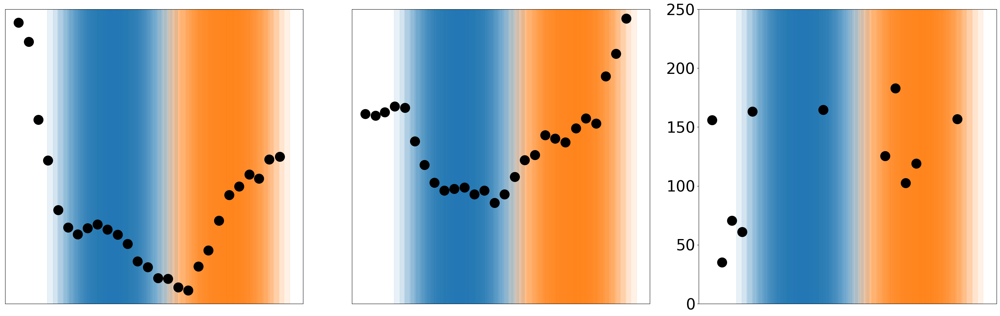

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1179  ACSF             395.851117              None               59.992779
1180  ACSF             377.853283              None              -34.210721
1181  ACSF             359.721601          Neighbor               99.448681
1182  ACSF             341.820838          Neighbor              102.273456
1183  ACSF             323.922983          Neighbor              109.085955
1184  ACSF             305.923801          Neighbor              116.123099
1185  ACSF             287.924720          Neighbor               24.455106
1186  ACSF             269.925763              None              109.117144
1187  ACSF             251.812317              None               73.770492
1188  ACSF             233.812317              None              189.473684
1189  ACSF             215.812317              None              610.881589
1190  ACSF             198.096751              None               53.227564
1191  ACSF  

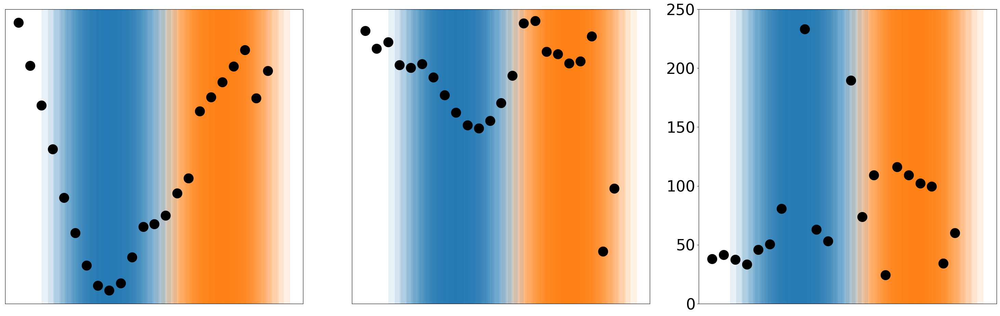

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1202  ACSF             468.596040              None               56.078767
1203  ACSF             450.706914          Neighbor              -21.660618
1204  ACSF             433.053510          Neighbor               30.540903
1205  ACSF             415.217623          Neighbor               39.009873
1206  ACSF             396.882982              None               58.002668
1207  ACSF             378.960158          Neighbor                     NaN
1208  ACSF             361.082200          Neighbor               92.597024
1209  ACSF             343.210975              None              229.659984
1210  ACSF             325.067836              None              231.574764
1211  ACSF             306.773430              None              461.508814
1212  ACSF             289.236095              None              585.456990
1213  ACSF             271.672385              None              303.662139
1214  ACSF  

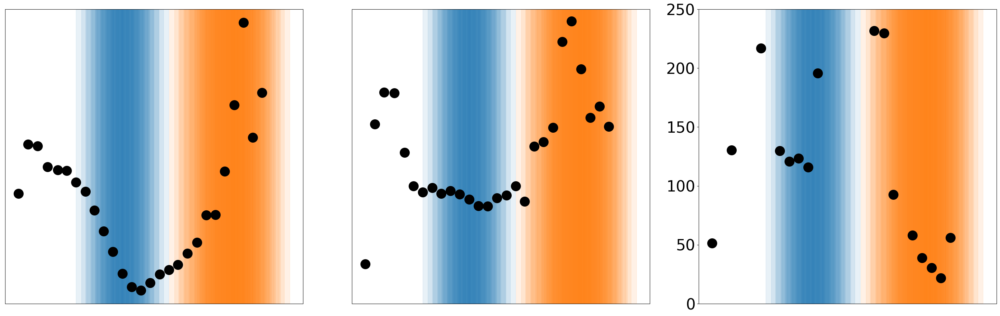

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1229  ACSF             493.782255              Home               41.987869
1230  ACSF             476.487451              Home               53.542933
1231  ACSF             457.983014              None               51.899616
1232  ACSF             438.863195              None              108.352157
1233  ACSF             422.523690              None              949.462880
1234  ACSF             403.629379              None              -87.008395
1235  ACSF             385.984076              None                     NaN
1236  ACSF             368.031629              None               92.926709
1237  ACSF             349.743653          Neighbor               88.445770
1238  ACSF             333.107004          Neighbor              100.744989
1239  ACSF             314.287840          Neighbor              212.072723
1240  ACSF             297.428058          Neighbor             -123.139348
1241  ACSF  

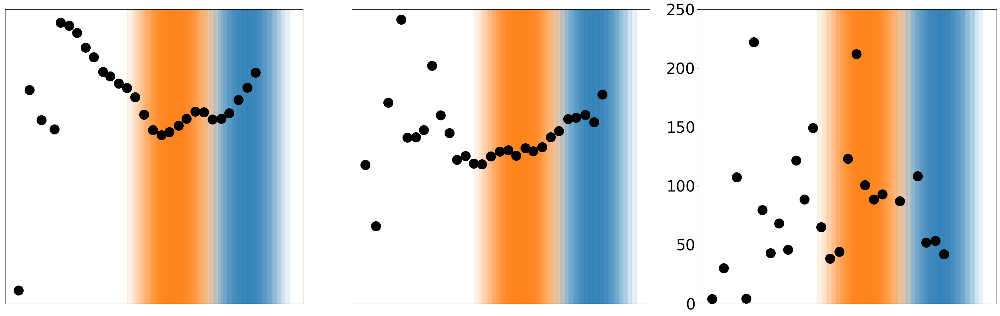

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1257  ACSF             387.382053              None               11.216218
1258  ACSF             371.152186              None               38.018967
1259  ACSF             352.941101              None                5.420519
1260  ACSF             336.338052              None               90.716170
1261  ACSF             318.285534              None              267.904587
1262  ACSF             298.996404              None              108.198819
1263  ACSF             280.386207          Neighbor               57.771616
1264  ACSF             264.036840          Neighbor               63.825896
1265  ACSF             246.484718          Neighbor               48.576880
1266  ACSF             230.114310          Neighbor               49.581323
1267  ACSF             212.612103              None               83.083709
1268  ACSF             196.161528              None               57.200383
1269  ACSF  

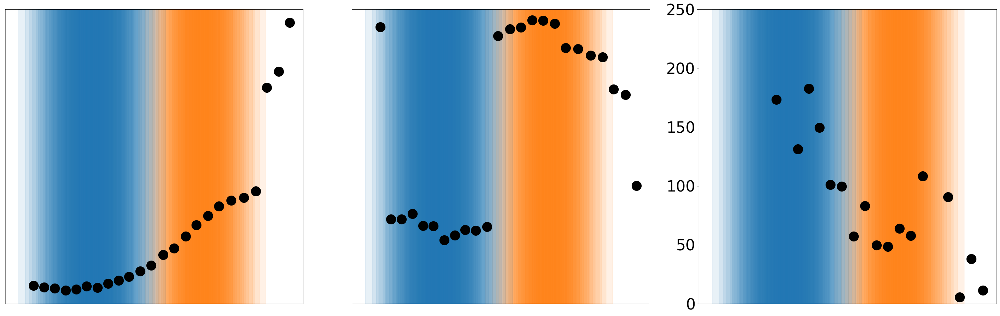

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1281  ACSF             433.249520              None              108.670469
1282  ACSF             415.797043              None               50.336406
1283  ACSF             397.399086              None               62.547784
1284  ACSF             380.160917              None               89.698044
1285  ACSF             361.871486              None              236.142453
1286  ACSF             343.759360              None             -847.231140
1287  ACSF             326.306398              Home             -150.020164
1288  ACSF             308.469001              None              -90.209234
1289  ACSF             290.246736              Home              -43.973583
1290  ACSF             273.527979              Home              -82.739972
1291  ACSF             255.242446              Home             -120.183151
1292  ACSF             236.590021              None              -89.607259
1293  ACSF  

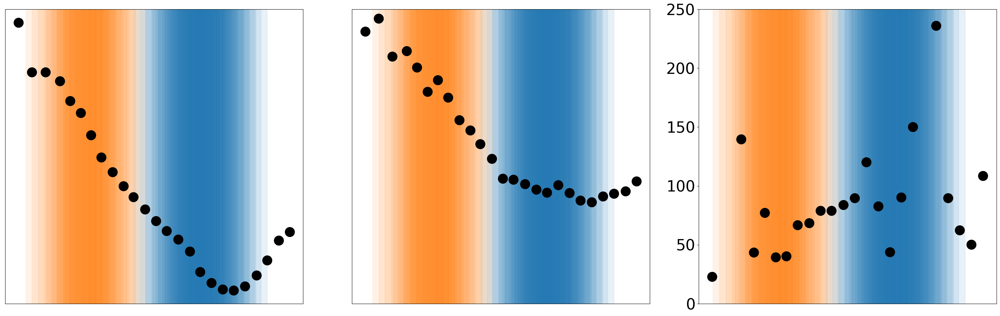

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1306  ACSF                  414.0          Neighbor               70.866142
1307  ACSF                  396.0          Neighbor               65.454545
1308  ACSF                  378.0              None              110.429448
1309  ACSF                  360.0          Neighbor              104.046243
1310  ACSF                  342.0              None              131.386861
1311  ACSF                  324.0              None              117.647059
1312  ACSF                  306.0              None              105.263158
1313  ACSF                  288.0              None               98.901099
1314  ACSF                  270.0              None               84.905660
1315  ACSF                  252.0              Home               62.068966
1316  ACSF                  234.0              Home               48.257373
1317  ACSF                  216.0              Home               85.714286
1318  ACSF  

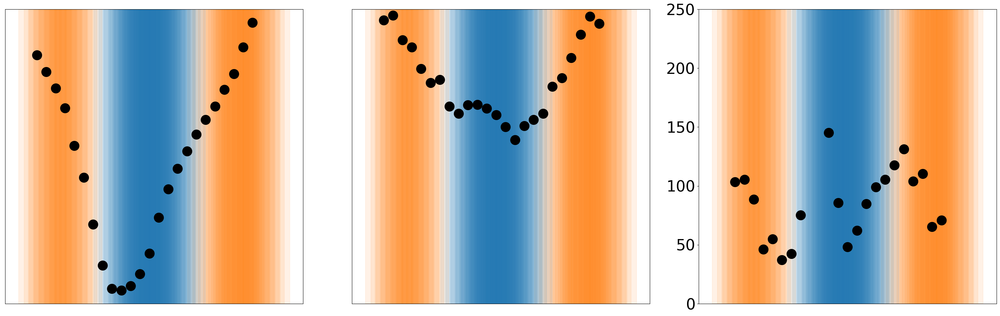

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1330  ACSF             486.997599          Neighbor                     NaN
1331  ACSF             468.861909          Neighbor             1502.669657
1332  ACSF             450.829873          Neighbor              108.808550
1333  ACSF             432.332419          Neighbor               93.987563
1334  ACSF             414.944720              None              376.750914
1335  ACSF             397.237427              None              305.498051
1336  ACSF             378.602046              None              169.327029
1337  ACSF             360.653381              None              188.198448
1338  ACSF             343.150926              None              174.989012
1339  ACSF             325.302046              None              205.412302
1340  ACSF             306.814939              Home              151.912016
1341  ACSF             288.889321              Home              111.476055
1342  ACSF  

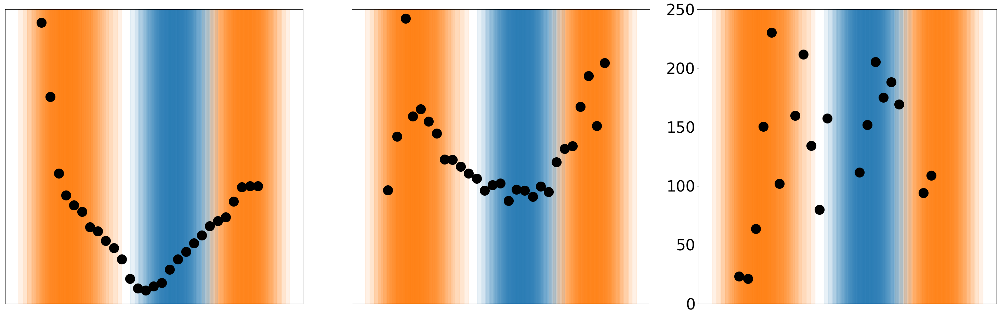

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1358  ACSF             388.429997          Neighbor               45.809505
1359  ACSF             370.472671          Neighbor              108.572589
1360  ACSF             352.449621              None              133.054860
1361  ACSF             334.753325              None              420.368201
1362  ACSF             317.097860              None             -670.971012
1363  ACSF             298.981643              None              126.957709
1364  ACSF             281.461479              Home              130.122041
1365  ACSF             262.854027              Home              216.442622
1366  ACSF             245.105732              Home              656.109537
1367  ACSF             227.390775              Home              329.621132
1368  ACSF             209.261613              Home              468.000847
1369  ACSF             191.945581              None              168.153445
1370  ACSF  

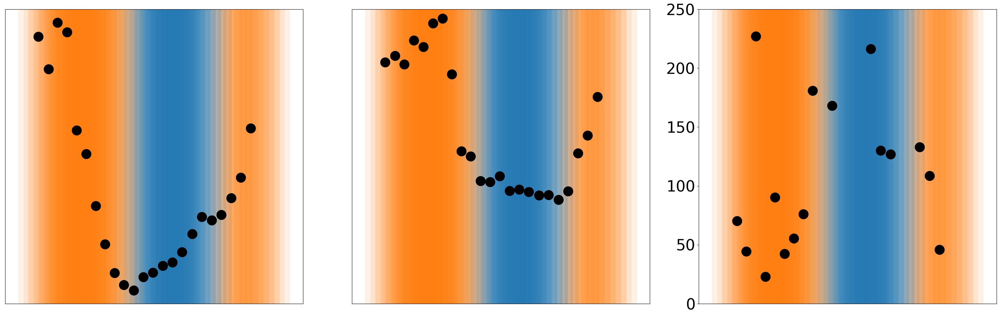

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1381  ACSF             370.751421          Neighbor               65.134056
1382  ACSF             353.165226          Neighbor                     NaN
1383  ACSF             335.685803              None               63.787050
1384  ACSF             317.378919              None              203.027219
1385  ACSF             299.715551              None              225.526861
1386  ACSF             282.124456              None              448.160282
1387  ACSF             264.198045              None              349.028440
1388  ACSF             246.746623              None              842.869355
1389  ACSF             229.046366              Home              485.889471
1390  ACSF             211.068456              Home              247.484450
1391  ACSF             193.744544              Home             1953.264586
1392  ACSF             176.165163              None              -80.120241
1393  ACSF  

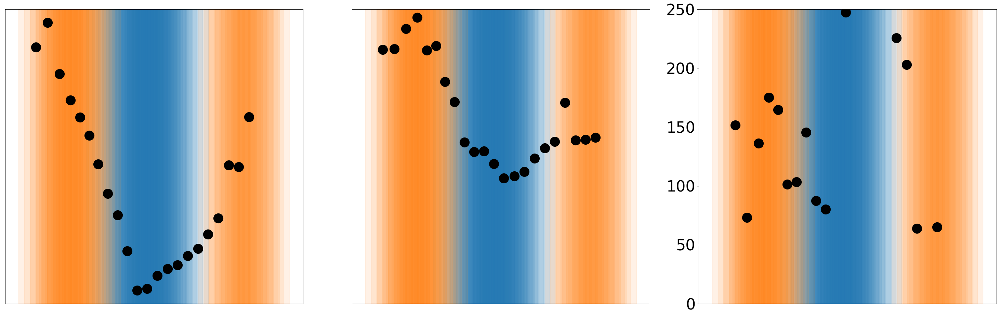

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1403  ACSF             444.364715              None               -4.072139
1404  ACSF             426.380112              None               52.505829
1405  ACSF             408.396866              None               27.799372
1406  ACSF             390.288355              None               17.567941
1407  ACSF             372.302297          Neighbor              -54.350687
1408  ACSF             354.317654          Neighbor               11.088297
1409  ACSF             336.334655          Neighbor              966.724610
1410  ACSF             318.353577          Neighbor               38.367074
1411  ACSF             300.374766          Neighbor               24.005779
1412  ACSF             282.255204          Neighbor               70.603130
1413  ACSF             264.272587              None               83.202580
1414  ACSF             246.292509              None              167.097021
1415  ACSF  

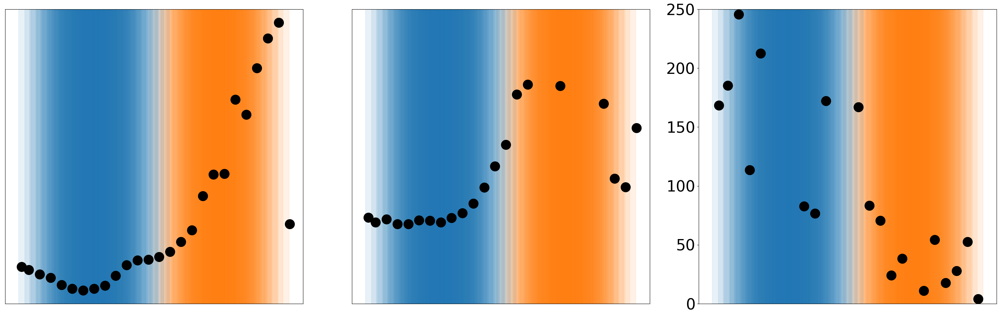

In [42]:
def identify_overlap_barrel(barrel_rois, roi):
    """ return a list of bools of whether roi overlaps w the barrel in barrel_rois
        0 - home barrel, 1 or 2 - neighbor barrel """
    overlap_ctr = OverlapCounterROI([], [])
    is_overlap = [overlap_ctr.do_rois_overlap(barrel, roi) for barrel in barrel_rois]
    return is_overlap

# set matplotlib font size
plt.rcParams.update({'font.size': 32})

# for each Slice/Location/Recording, plot the latency of each ladder ROI
num_legends = 1
for date in ladder_df['Date'].unique():
    date_df = ladder_df[ladder_df['Date'] == date]
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]

        # see if we have an ROI file for this slice/recording
        # look up ROI file from crossing_data
        barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == slic_df['Recording'].values[0]) ]
        if barrel_df_sub.empty:
            # then try to look it up in ppr_df_for_roi_lookup
            barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == slic_df['Recording'].values[0]) ]
            if barrel_df_sub.empty:
                print('No ROI file found for ', date, slic, slic_df['Recording'].values[0])
                continue
        handles = []
        fig, ax = plt.subplots(1, 3, figsize=(30, 10))

        for rec in slic_df['Recording'].unique():
            rec_df = slic_df[slic_df['Recording'] == rec]

            # look up ROI file from crossing_data
            barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == rec) ]
            if barrel_df_sub.empty:
                # then try to look it up in ppr_df_for_roi_lookup
                barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == rec) ]
                if barrel_df_sub.empty:
                    print('No ROI file found for ', date, slic, rec)
                    continue

            roi_file = barrel_df_sub['ROI file'].values[0]
            drug = barrel_df_sub['drug'].values[0]
            stim_layer = barrel_df_sub['Layer'].values[0]

            # save roi_file, drug, and stim_layer in ladder_df in new columns
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'ROI file'] = roi_file
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'drug'] = drug
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'Layer'] = stim_layer

            # read in the ROI file
            rois = ROIFileReader(roi_file).get_roi_list()

            # get the center of the home barrel
            home_barrel_center = LaminarROI(rois[0], input_diode_numbers=True).get_center()

            # convert from diode to pixel
            rois = [LaminarROI(roi, input_diode_numbers=True).get_points()
                        for roi in rois]

            # first roi is home barrel, rest are neighboring barrels
            home_barrel = rois[0]
            neighbor_barrels = rois[1:]

            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[rec_df['ROI'] == roi]
                # get the center of the ROI
                x_center = roi_df['X_Center'].values[0]
                y_center = roi_df['Y_Center'].values[0]

                is_overlap = identify_overlap_barrel(rois, [[int(x_center), int(y_center)]])

                # also calculate distance from home barrel along barrel axis
                ln = Line(home_barrel_center, [x_center, y_center])
                dist = ln.get_length()

                resides_in_barrel = None
                if is_overlap[0]:
                    resides_in_barrel = 'Home'
                elif is_overlap[1] or (len(is_overlap) > 2 and is_overlap[2]):
                    resides_in_barrel = 'Neighbor'

                # store in ladder_df
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'resides_in_barrel'] = resides_in_barrel

            # now calculate which ROI is the closest to the home barrel
            arg_min = rec_df['Dist_from_home_barrel'].argmin()
            # get the ROI of the closest ROI
            closest_roi = rec_df.iloc[arg_min]
            closest_x = closest_roi['X_Center']
            closest_y = closest_roi['Y_Center']

            # also, which ROI is closest to the stim (min Stim_Distance)
            arg_min_stim = rec_df['Stim_Distance'].argmin()
            closest_stim_roi = rec_df.iloc[arg_min_stim]
            
            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[(rec_df['ROI'] == roi)]
                dist_to_closest_roi = Line([closest_x, closest_y], 
                                            [roi_df['X_Center'].values[0],
                                                roi_df['Y_Center'].values[0]]).get_length()

                # denote negative distances as those to one side of the closest ROI
                if roi_df['ROI'].values[0] > closest_roi['ROI']:
                    dist_to_closest_roi *= -1

                ladder_df.loc[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist_to_closest_roi * 6.0  # px -> um
                
                # refresh data before plotting
                roi_df = ladder_df[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi)]

                color = 'black' if drug == 'ACSF' else 'tab:green'
                region_color = None
                if roi_df['resides_in_barrel'].values[0] == 'Home':
                    region_color = 'tab:blue'
                if np.abs(roi - closest_stim_roi['ROI']) < 2:
                    region_color = 'tab:blue'
                elif roi_df['resides_in_barrel'].values[0] == 'Neighbor':
                    region_color = 'tab:orange'
                
                for sub_ax in ax:
                    # shade a vertical region of each plot around this ROI
                    if region_color is not None:
                        for radius in range(1, 76, 10):
                            sub_ax.axvspan(roi_df['Dist_from_home_barrel'].values[0] - radius, 
                                        roi_df['Dist_from_home_barrel'].values[0] + radius, 
                                        color=region_color, alpha=(0.06 if stim_layer == 'L2/3' else 0.1))
                    # draw a black dotted vertical line at the closest_stim_roi
                    if roi == closest_stim_roi['ROI'] and drug != 'ACSF':
                        #sub_ax.axvline(x=roi_df['Dist_from_home_barrel'].values[0], color='black', linestyle='--',
                        #            linewidth=4)

                        # and a black star next to the line at 50% the middle of the y-axis scale
                        middle_y = (sub_ax.get_ylim()[0] + sub_ax.get_ylim()[1]) / 2
                        if sub_ax == ax[2]:
                            middle_y = 0

                        #sub_ax.plot(roi_df['Dist_from_home_barrel'].values[0], middle_y, 
                        #            color='black', marker='*', markersize=20)
                
                if drug == 'ACSF':  # exclude NBQX data from the plot now
                    # plot the latency vs distance from home barrel
                    #if 10 > roi_df['latency'].values[0] > 1:
                    ax[0].plot(roi_df['Dist_from_home_barrel'], roi_df['latency'], 
                            label=str(resides_in_barrel),
                            color=color, marker='o', markersize=20,
                            markeredgecolor='black')

                    # Now also plot the amplitude vs distance from home barrel
                    #ax[1].plot(roi_df['Dist_from_home_barrel'], roi_df['amp'] / 10, 
                    #            label=drug,
                    #            color=color, marker='o', markersize=20,
                    #            markeredgecolor='black')

                    # now also plot the half-width vs distance from home barrel
                    ax[1].plot(roi_df['Dist_from_home_barrel'], roi_df['halfwidth'], 
                                label=drug,
                                color=color, marker='o', markersize=20,
                                markeredgecolor='black')
            
            # now we also want to calculate the velocity of the ladder
            # for each pair of ROIs i and i+1, calculate the velocity as the distance between the two ROIs
            # divided by the difference in latency between the two ROIs
            # this will give the velocity in um/ms
            for i in range(1, len(rec_df)):
                roi1 = rec_df.iloc[i-1]
                roi2 = rec_df.iloc[i]
                dist = roi2['Dist_from_home_barrel'] - roi1['Dist_from_home_barrel']
                position = (roi2['Dist_from_home_barrel'] + roi1['Dist_from_home_barrel']) / 2
                latency_diff = roi2['latency'] - roi1['latency']
                velocity = dist / latency_diff
                if 5000 > velocity > -1000:
                    if drug == 'ACSF':
                        ax[2].plot(position, np.abs(velocity), color=color, linestyle='-', marker='o', markersize=20,
                    markeredgecolor='black')
                    # track this in the df as the velocity of roi i-1
                    ladder_df.loc[(ladder_df['Date'] == date) &
                                    (ladder_df['Slice'] == slic) &
                                    (ladder_df['Recording'] == rec) &
                                    (ladder_df['ROI'] == roi1['ROI']), 'instantaneous_velocity'] = velocity
            
            if drug == 'ACSF':
                subset_df_ = ladder_df[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec)]
                print(subset_df_[['drug', 'Dist_from_home_barrel', 'resides_in_barrel', 'instantaneous_velocity']])
                if len(subset_df_) > 40:
                    print(subset_df_)


        #for sub_ax in ax:
            #sub_ax.set_xlabel('Distance along L4 (um)')
        #ax[0].set_ylabel('Latency (ms)')
        #ax[1].set_ylabel('Δf/f (%)')
        #ax[2].set_ylabel('Half-Width (ms)')
        #ax[3].set_ylabel('Velocity (um/ms)')
        ax[1].set_ylim(0, ax[1].get_ylim()[1])
        
        for i in range(3):
            ax[i].set_xticks([])
        ax[0].set_yticks([])
        ax[1].set_yticks([])
        ax[2].set_ylim(0, 250)
        #ax[0].set_title()
        handles = ax[0].get_legend_handles_labels()
        handles = [handles[0][0], handles[0][-1]]
        if num_legends > 0:
            #ax[0].legend(handles=handles, labels=['ACSF', '+NBQX'], loc='upper left')
            num_legends -= 1
        plt.tight_layout()
        plt.savefig(output_fig_dir + 'Ladder_velocity_plot_' \
                + date.replace('/', '-') + '_' + str(slic) + '_' + stim_layer.replace("/", "") + '_' + str(rec) + '_latency.png')
        print('Date: ' + date + '   Slice: ' + str(slic) + '   Stim: ' + stim_layer )
        plt.show()
        

Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_

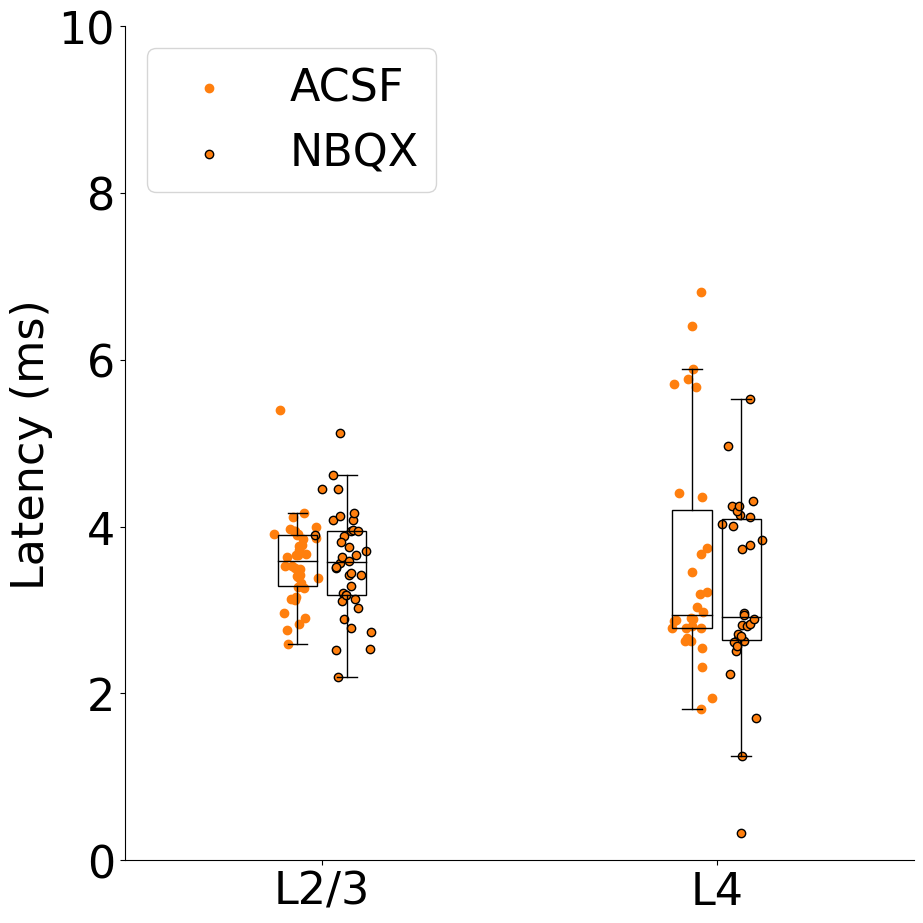

L2/3 Neighbor ACSF 3.163 +/- 0.307 um/ms
L4 Neighbor ACSF 4.083 +/- 0.590 um/ms
L2/3 Neighbor NBQX 4.736 +/- 0.466 um/ms
L4 Neighbor NBQX 1.672 +/- 0.210 um/ms
0.14817413862048529
6.802823513986304e-07
Significant difference between L2/3 and L4 for amp in NBQX


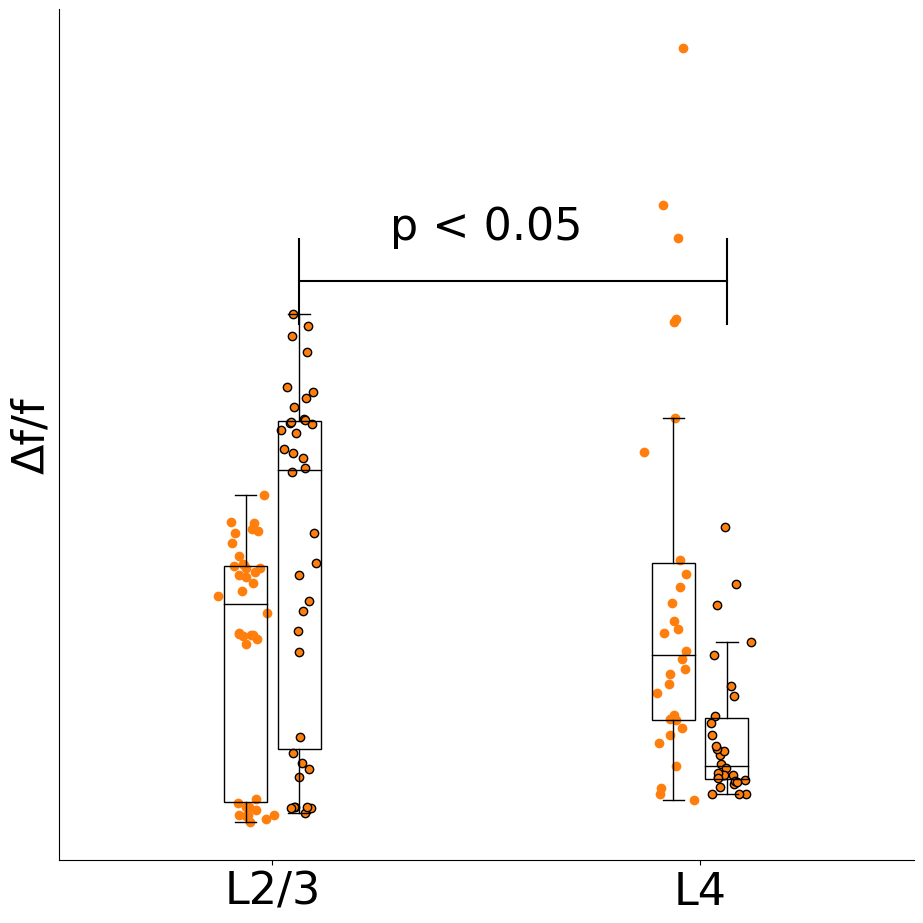

L2/3 Neighbor ACSF 10.89 +/- 0.480 um/ms
L4 Neighbor ACSF 15.94 +/- 1.166 um/ms
L2/3 Neighbor NBQX 6.016 +/- 0.292 um/ms
L4 Neighbor NBQX 10.26 +/- 1.544 um/ms
5.325960559114825e-05
Significant difference between L2/3 and L4 for halfwidth in ACSF
0.0036001167886001674


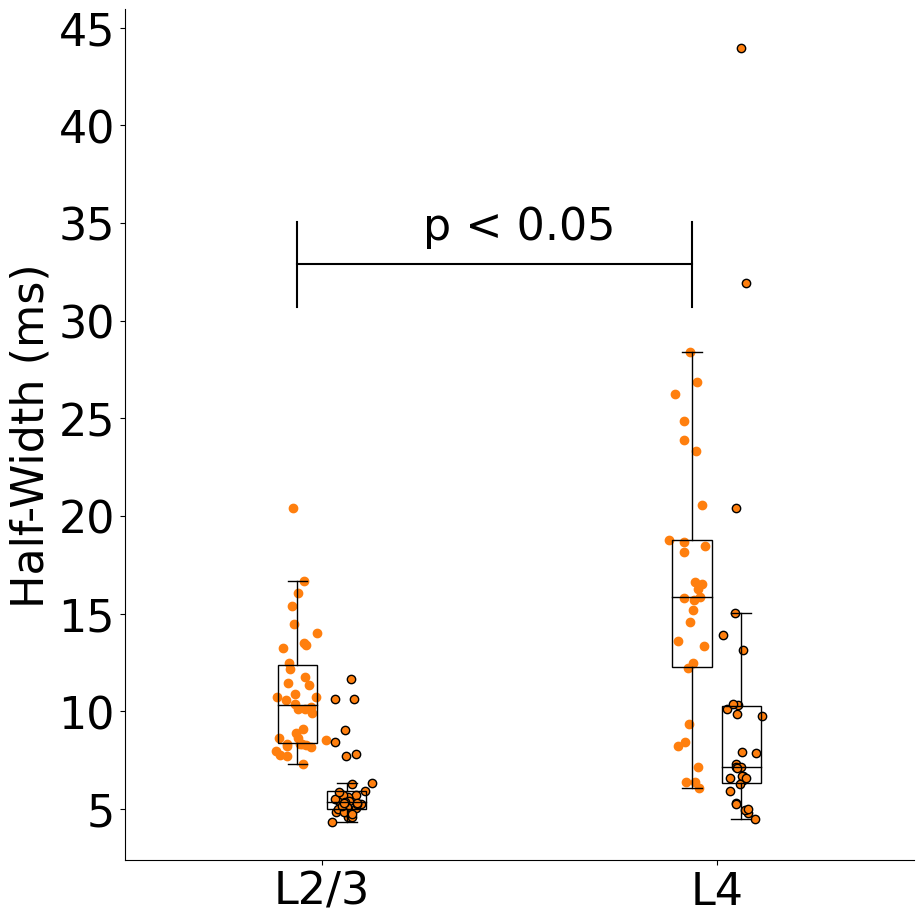

L2/3 Neighbor ACSF 152.9 +/- 25.16 um/ms
L4 Neighbor ACSF 287.4 +/- 136.9 um/ms
L2/3 Neighbor NBQX 113.2 +/- 10.28 um/ms
L4 Neighbor NBQX 145.1 +/- 27.10 um/ms
0.28932846430069437
0.2399541363336317


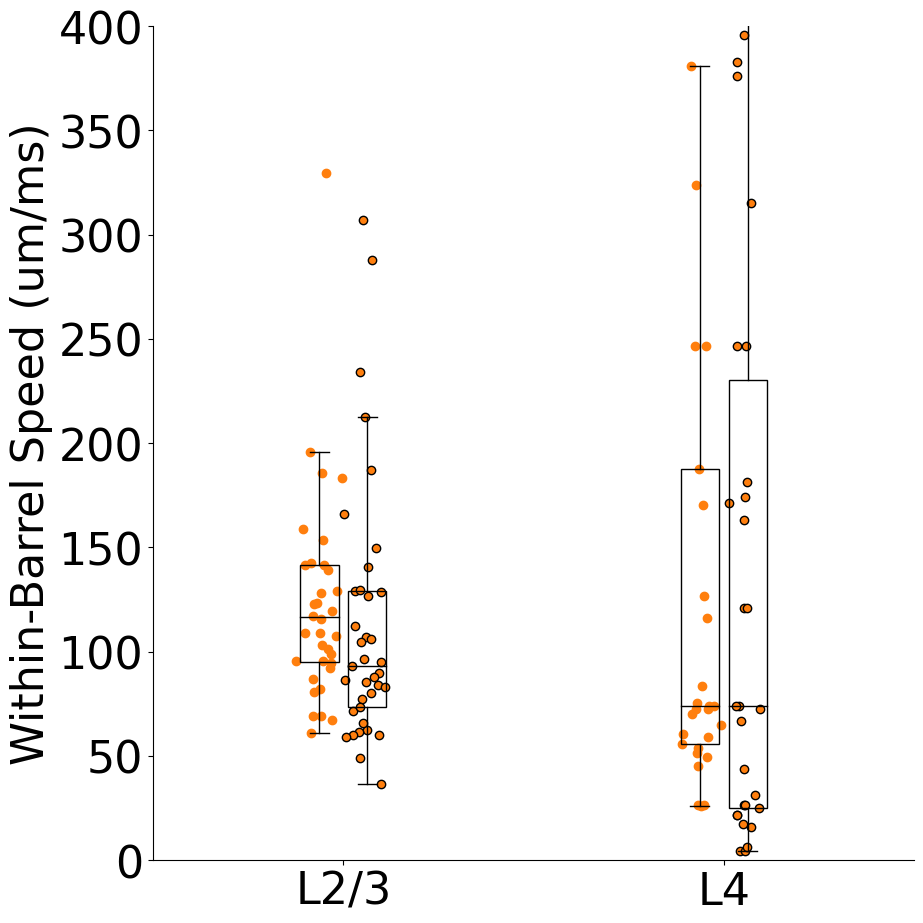

In [ ]:
# make a 1-d scatter plot of the average speed
# broken down by home vs neighbor barrel and L2/3 vs L4

# remove any row in ladder_df_2 from ladder_df that has the same date/slice/recording/ROI as ladder_df
ladder_df_nbqx = ladder_df.copy()
for row in ladder_df_nbqx.iterrows():
    date = row[1]['Date']
    slic = row[1]['Slice']
    rec = row[1]['Recording']
    #print(f"Checking {date} {slic} {rec} {roi} in ladder_df_2")
    if len(ladder_df_2[(ladder_df_2['Date'] == date) & 
                            (ladder_df_2['Slice'] == slic) & 
                            (ladder_df_2['Recording'] == rec)]) > 0:
        ladder_df_nbqx.drop(row[0], inplace=True)
        print(f"Removing {date} {slic} {rec} from ladder_df_nbqx")

# matplotlib font size larger
plt.rcParams.update({'font.size': 32})

for metric, label in zip(['latency', 'amp', 'halfwidth', 'instantaneous_velocity'], 
                            ['Latency (ms)', 'Δf/f', 'Half-Width (ms)', 'Within-Barrel Speed (um/ms)']):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    layers = ['L2/3', 'L4']
    drug = ['ACSF', 'NBQX']
    # boxplots of the average speed
    for j, d in enumerate(drug):
        speeds = []
        positions = []
        for i, layer in enumerate(layers):
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['drug'] == d) & 
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                speed = [s for s in list(np.abs(region_df[metric])) if not np.isnan(s)]

                speeds.append(speed)
                positions.append(i + j/8 - 1/16)
                # print the mean +/- sem of the speed
                print(layer, region, d, str(np.mean(speed))[:5], "+/-", str(sem(speed))[:5], "um/ms")
        ax.boxplot(speeds, positions=positions, 
                        showfliers=False, patch_artist=True,
                        boxprops=dict(facecolor=(0,0,0,0)),
                        widths=0.1,
                        medianprops=dict(color='black'))
        

    # scatter plot of the average speed
    for i, layer in enumerate(layers):
        for j, d in enumerate(drug):
            edgecolors= "black" if d == 'NBQX' else None
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['drug'] == d) & 
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                x_jitter = np.random.normal(i + j/8 - 1/16, 0.025, len(region_df))
                ax.scatter(x_jitter, 
                                np.abs(region_df[metric]), 
                                label=d, 
                                color='tab:blue' if region == 'Home' else 'tab:orange',
                                edgecolors=edgecolors)
                
                if metric == 'instantaneous_velocity':
                    ax.set_ylim(0, 400)
                elif metric == 'latency':
                    ax.set_ylim(0, 10)
                elif metric == 'amp':
                    # ax.set_ylim(0, 10.5)
                    ax.set_yticks([])
                elif metric == 'halfwidth':
                    pass # ax.set_ylim(0, 2.5)
                ax.set_xlim(-.5, 1.5)
                ax.set_xticks([0, 1])
                ax.set_xticklabels(layers)

    for drug_sig in ['ACSF', 'NBQX']:
        
        # is there a significant difference between neighbor L2/3 and neighbor L4? For ACSF
        neighbor_L23 = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == 'L2/3') & 
                                    (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor')&
                                    (ladder_df_nbqx['drug'] == drug_sig)][metric]
        neighbor_L4 = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == 'L4') &
                                    (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor') &
                                    (ladder_df_nbqx['drug'] == drug_sig)][metric]
        # get rid of nans
        neighbor_L23 = [s for s in list(np.abs(neighbor_L23)) if not np.isnan(s)]
        neighbor_L4 = [s for s in list(np.abs(neighbor_L4)) if not np.isnan(s)]
        t_stat, p_val = ttest_ind(neighbor_L23, neighbor_L4)
        print(p_val)
        if p_val * 20 < 0.05:  #  x 20 for pseudo-multiple testing correction
            print('Significant difference between L2/3 and L4 for ' + metric + ' in ' + drug_sig)
            # place in terms of fraction of the y-axis
            ax.text(0.5, 0.73 * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0], 'p < 0.05', ha='center')
            # draw a line between the two boxes. shift it right a bit if drug_sig == 'NBQX', left if drug_sig == 'ACSF'
            drug_sig_shift = 1/16 if drug_sig == 'NBQX' else -1/16
            drug_sig_yshift = 0.02 if drug_sig == 'NBQX' else 0.0
            y_height = (0.7 - drug_sig_yshift) * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0]
            ax.plot([drug_sig_shift, 1+drug_sig_shift], [y_height, y_height], color='black') 
            
            # vertical segments at the ends of the bar to make it a bracket
            brack_cap = 0.05 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.plot([drug_sig_shift, drug_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')
            ax.plot([1+drug_sig_shift, 1+drug_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')

            #ax.text(0.5, 730, 'p < 0.05', ha='center')
            # draw a line between the two boxes
            #ax.plot([0, 1], [700, 700], color='black')
            # vertical segments at the ends of the bar to make it a bracket
            #ax.plot([0, 0], [700, 650], color='black')
            #ax.plot([1, 1], [700, 650], color='black')
            #ax.plot([-.1, .1], [650, 650], color='black')
            #ax.plot([1-.1, 1+.1], [650, 650], color='black')



    ax.set_ylabel(label)
    # set spines to be invisible
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # legend in top left, but with only the first two labels
    handles = ax.get_legend_handles_labels()
    if metric == 'latency':
        ax.legend(handles=handles[0][:2], labels=handles[1][:2], loc='upper left')
    # tight layout
    plt.tight_layout()
    plt.savefig(output_fig_dir + '/' + metric + '.png')
    plt.show()

c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:160: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:174: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:176: RuntimeWarning: invalid value encountered in double_scalars
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:160: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:174: RuntimeWarning: invalid valu

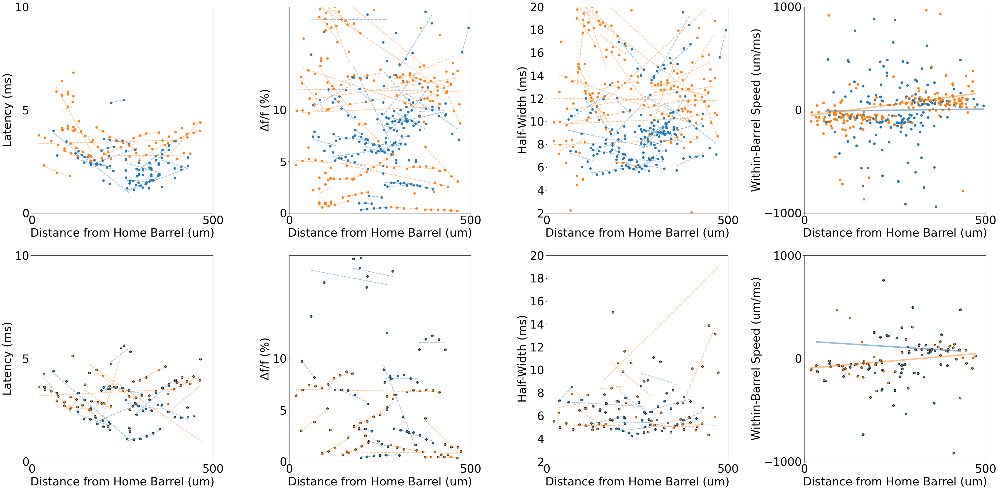

In [44]:
# show correlation of latency, halfwidth, amp, and velocity with distance from home barrel
# plot each metric vs distance from home barrel, each date/slice/recording in a different color
# with the NBQX data in markeredgecolor='black'
# fit and plot a linear regression line for each date/slice/recording

fig, ax = plt.subplots(2, 4, figsize=(40, 20))
layers = ['L2/3', 'L4']
drug = ['ACSF', 'NBQX']
handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        for i_reg, region in enumerate(['Home', 'Neighbor']):
            for date in ladder_df['Date'].unique():
                for slic in ladder_df['Slice'].unique():
                    for rec in ladder_df['Recording'].unique():

                        region_df = ladder_df[(ladder_df['Layer'] == layer) & 
                                                (ladder_df['drug'] == d) & 
                                                (ladder_df['resides_in_barrel'] == region) &
                                                (ladder_df['Date'] == date) &
                                                (ladder_df['Slice'] == slic) &
                                                (ladder_df['Recording'] == rec)]
                        # get rid of nans
                        region_df = region_df[region_df['Dist_from_home_barrel'].notna()]
                        region_df = region_df[region_df['latency'].notna()]
                        region_df = region_df[region_df['amp'].notna()]
                        region_df = region_df[region_df['halfwidth'].notna()]
                        region_df = region_df[region_df['instantaneous_velocity'].notna()]

                        if region_df.empty:
                            continue

                        # fit a linear regression line to the data
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['latency'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept
                        
                        # plot the data and the line
                        color = 'tab:blue' if region == 'Home' else 'tab:orange'
                        edgecolors= "black" if d == 'NBQX' else None
                        
                        ax[j][0].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['latency'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')
                        
                        ax[j][0].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)

                        # now do the same for amp
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['amp'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept

                        ax[j][1].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['amp'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')

                        ax[j][1].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)
                        # now do the same for halfwidth
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['halfwidth'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept
                        ax[j][2].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['halfwidth'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')

                        ax[j][2].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)
                        
                        # now do the same for velocity
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['instantaneous_velocity'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(),
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept
                        ax[j][3].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['instantaneous_velocity'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')
                                        
                        #ax[j][3].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)
                        # print the slope and r^2 value for each metric
                        '''print(layer, region, d, 'Latency', str(slope)[:5], str(r_value**2)[:5])
                        print(layer, region, d, 'Amp', str(slope)[:5], str(r_value**2)[:5])
                        print(layer, region, d, 'Halfwidth', str(slope)[:5], str(r_value**2)[:5])
                        print(layer, region, d, 'Velocity', str(slope)[:5], str(r_value**2)[:5])
                        # print the p-value for each metric
                        print(layer, region, d, 'Latency', str(p_value)[:5])
                        print(layer, region, d, 'Amp', str(p_value)[:5])
                        print(layer, region, d, 'Halfwidth', str(p_value)[:5])
                        print(layer, region, d, 'Velocity', str(p_value)[:5])
                        # print the std_err for each metric
                        print(layer, region, d, 'Latency', str(std_err)[:5])
                        print(layer, region, d, 'Amp', str(std_err)[:5])
                        print(layer, region, d, 'Halfwidth', str(std_err)[:5])
                        print(layer, region, d, 'Velocity', str(std_err)[:5])
                        # print the number of points for each metric
                        print(layer, region, d, 'Latency', len(region_df['latency']))
                        print(layer, region, d, 'Amp', len(region_df['amp']))
                        print(layer, region, d, 'Halfwidth', len(region_df['halfwidth']))
                        print(layer, region, d, 'Velocity', len(region_df['instantaneous_velocity']))
                        # print the mean and std of each metric
                        print(layer, region, d, 'Latency', str(np.mean(region_df['latency']))[:5], str(np.std(region_df['latency']))[:5])
                        print(layer, region, d, 'Amp', str(np.mean(region_df['amp']))[:5], str(np.std(region_df['amp']))[:5])
                        print(layer, region, d, 'Halfwidth', str(np.mean(region_df['halfwidth']))[:5], str(np.std(region_df['halfwidth']))[:5])
                        print(layer, region, d, 'Velocity', str(np.mean(region_df['instantaneous_velocity']))[:5], str(np.std(region_df['instantaneous_velocity']))[:5])
                        '''
                        # save plot to file
                        #ax[0].set_title('Latency vs Distance from Home Barrel')
                        #ax[1].set_title('Amp vs Distance from Home Barrel')
                        #ax[2].set_title('Halfwidth vs Distance from Home Barrel')
                        #ax[3].set_title('Velocity vs Distance from Home Barrel')
                        ax[j][0].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][1].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][2].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][3].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][0].set_ylabel('Latency (ms)')
                        ax[j][1].set_ylabel('Δf/f (%)')
                        ax[j][2].set_ylabel('Half-Width (ms)')
                        ax[j][3].set_ylabel('Within-Barrel Speed (um/ms)')
                        ax[j][0].set_ylim(0, 8)
                        ax[j][1].set_ylim(0, 20)
                        ax[j][2].set_ylim(2, 20)
                        ax[j][3].set_ylim(-1000, 1000)
                        ax[j][0].set_xlim(0, 500)
                        ax[j][1].set_xlim(0, 500)
                        ax[j][2].set_xlim(0, 500)
                        ax[j][3].set_xlim(0, 500)
                        ax[j][0].set_xticks([0, 500])
                        ax[j][1].set_xticks([0, 500])
                        ax[j][2].set_xticks([0, 500])
                        ax[j][3].set_xticks([0, 500])
                        ax[j][0].set_xticklabels([ 0, 500])
                        ax[j][1].set_xticklabels([ 0, 500])   
                        ax[j][2].set_xticklabels([ 0, 500])
                        ax[j][3].set_xticklabels([ 0, 500])
                        ax[j][0].set_yticks([0, 5, 10])
                        ax[j][1].set_yticks([0, 5, 10])
                        ax[j][3].set_yticks([-1000, 0, 1000])
                        ax[j][0].set_yticklabels([0, 5, 10])

# Is there overall correlation between velocity and distance from home barrel?
# fit a single linear regression line to all data points (drug, region-specific)
for i_reg, region in enumerate(['Home', 'Neighbor']):
    for j, d in enumerate(drug):
        region_df = ladder_df[(ladder_df['drug'] == d) & 
                                (ladder_df['resides_in_barrel'] == region)]
        # get rid of nans
        region_df = region_df[region_df['Dist_from_home_barrel'].notna()]
        region_df = region_df[region_df['latency'].notna()]
        region_df = region_df[region_df['amp'].notna()]
        region_df = region_df[region_df['halfwidth'].notna()]
        region_df = region_df[region_df['instantaneous_velocity'].notna()]

        if region_df.empty:
            continue

        # fit a linear regression line to the data
        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                    region_df['instantaneous_velocity'])
        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                        region_df['Dist_from_home_barrel'].max(), 100)
        y = slope * x + intercept
        
        # plot the data and the line
        color = 'tab:blue' if region == 'Home' else 'tab:orange'
        edgecolors= "black" if d == 'NBQX' else None
        
        ax[j][3].scatter(region_df['Dist_from_home_barrel'], 
                        region_df['instantaneous_velocity'], 
                        label=d, 
                        color=color,
                        edgecolors=edgecolors,
                        marker='o')
        
        ax[j][3].plot(x, y, color=color, linewidth=4, alpha=0.5)


plt.tight_layout()          
plt.savefig(output_fig_dir + '/' + layer + '_' + region + '_' + d + '_latency_vs_distance.png')
plt.show()


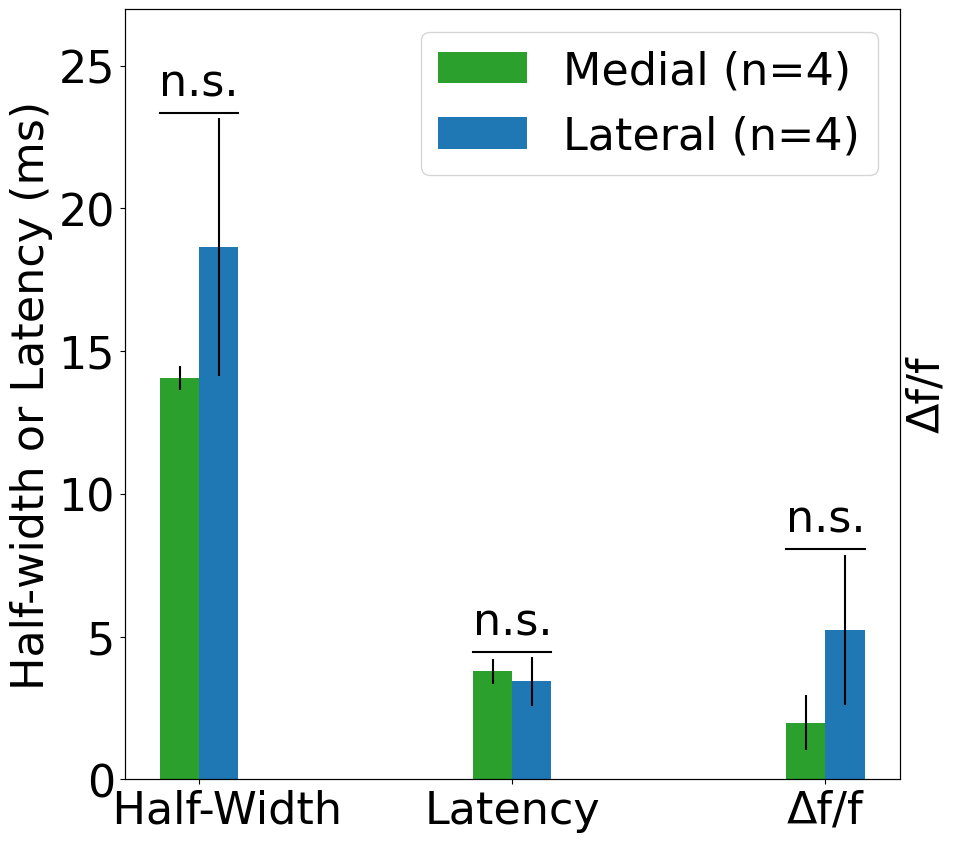

In [45]:
# using the 'Medial/Lateral' column in file export_summar_hw_latency_amp.csv, compare medial and lateral neighbor barrels
# for each layer and drug
# read in hw/lat/amp data
hw_lat_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/' + 'export_summary_hw_latency_amp.csv'
hw_lat_df = pd.read_csv(hw_lat_data)
hw_lat_df['latency'] -= 48.6

# plot the data that has 'Medial/Lateral' column populated. Restrict to L4 and ACSF and neighbor barrels (ROI > 1)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot only for L4, not for L2/3. Compare latency, half-width, and amplitude for medial vs lateral neighbor barrels
directions = ['Medial', 'Lateral']
handles = []

for i, direction in enumerate(directions):
    color = 'tab:blue' if direction == 'Lateral' else 'tab:green'
    for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
        # get the data for the direction
        direction_df = hw_lat_df[(hw_lat_df['Layer'] == 'L4') & 
                                (hw_lat_df['drug'] == 'ACSF') & 
                                (hw_lat_df['ROI'] > 1) & 
                                (hw_lat_df['Medial/Lateral'] == direction)]
        # plot the data
        l1 = ax.bar(j + i / 8 - 1/16, 
                        np.mean(direction_df[metric]), 
                        yerr=sem(direction_df[metric]), 
                        width=.125,
                        color=color, label=direction)
        handles.append(l1)

# legend: Medial in black, Lateral in green
ax.legend(handles=[handles[0], handles[-1]], labels=['Medial (n=4)', 'Lateral (n=4)'], loc='upper right')

ax.set_ylabel('Half-width or Latency (ms)')
# right-side y-axis label
ax2 = ax.twinx()
ax2.set_ylabel('Δf/f')
ax2.set_yticks([])

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['    Half-Width', 'Latency', 'Δf/f'])

# significance testing Medial vs Lateral
for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
    med = hw_lat_df[(hw_lat_df['Layer'] == 'L4') & 
                                        (hw_lat_df['drug'] == 'ACSF') & 
                                        (hw_lat_df['ROI'] > 1) & 
                                        (hw_lat_df['Medial/Lateral'] == 'Medial')][metric]
    lat = hw_lat_df[(hw_lat_df['Layer'] == 'L4') &
                                        (hw_lat_df['drug'] == 'ACSF') &
                                        (hw_lat_df['ROI'] > 1) &
                                        (hw_lat_df['Medial/Lateral'] == 'Lateral')][metric]
    t_stat, p_val = ttest_ind(med, lat, equal_var=False)
    # draw bar between the two boxes # ax.get_ylim()[1] * 0.8
    height = max(med.mean() + sem(med), lat.mean() + sem(lat)) + 0.2

    ax.plot([j - 1/8, j + 1/8], [height, height], color='black')
    if p_val < 0.05:
        ax.text(j, height + .6, 'p < 0.05', ha='center')

        
    else:
        ax.text(j, height + .6, 'n.s.', ha='center')

# raise the y-axis limit by 10% to make room for the significance testing
ax.set_ylim(0, ax.get_ylim()[1] * 1.1)


plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/hw_lat_amp_medial_lateral.png')
plt.show()

In [46]:
# for each row in ladder_df, populate drug, layer, and Medial/Lateral columns by looking it up in hw_lat_df
for i, row in ladder_df.iterrows():
    date = row['Date']
    slic = row['Slice']
    rec = row['Recording']
    loc = row['Location']
    ladder_roi = row['ROI']
    x_center = row['X_Center']
    y_center = row['Y_Center']

    # to know which barrel roi this is in, find the closest roi in the hw_lat_df

    hw_lat_rows = hw_lat_df[(hw_lat_df['Date'] == date) &
                            (hw_lat_df['Slice'] == slic) &
                            (hw_lat_df['Location'] == loc) &
                            (hw_lat_df['Recording'] == rec)]
            
    
    if hw_lat_rows.empty:
        print('No data found for ', date, slic, rec, loc)
        continue

    # go through the matched rows, pull x_center and y_center, and calculate the distance to the ladder roi
    min_dist = np.Inf
    min_dist_row = None
    for j, hw_lat_row in hw_lat_rows.iterrows():
        dist = np.sqrt((x_center - hw_lat_row['X_Center'])**2 + (y_center - hw_lat_row['Y_Center'])**2)
        if dist < min_dist:
            min_dist = dist
            min_dist_row = hw_lat_row
    if min_dist_row is None:
        print('No data found for ', date, slic, rec, loc)
        continue
    # populate the drug, layer, and Medial/Lateral columns in ladder_df from the min_dist_row
    ladder_df.loc[i, 'drug'] = min_dist_row['drug']
    ladder_df.loc[i, 'Layer'] = min_dist_row['Layer']
    ladder_df.loc[i, 'Medial/Lateral'] = min_dist_row['Medial/Lateral']

print(ladder_df['Medial/Lateral'])

ladder_df

No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,...,Location,Recording,trace,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity,ROI file,drug,Layer,Medial/Lateral
0,1,0.408552,19.7128,3.9030,16.6507,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,...,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,368.804275,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN
1,2,0.462050,27.5393,3.9159,14.4435,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,...,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,350.406813,Neighbor,422.912185,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN
2,3,0.441868,28.2700,3.8743,13.6368,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,...,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,332.813666,None,1626.003658,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN
3,4,0.466602,22.1134,3.8636,13.2221,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,...,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,315.415427,Neighbor,183.157884,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN
4,5,0.526346,26.8669,3.7651,10.1029,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,...,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,297.374375,Neighbor,139.073187,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,22,10.513800,NaN,32.4017,10.5138,87.361319,68.000000,42.000000,3_rois_output__ladder_ pulse1,4/16/2025,...,2,1,NaN,66.068147,Home,-113.564718,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,ACSF,L4,NaN
1425,23,10.499200,NaN,32.5608,10.4992,93.914855,71.000000,42.500000,3_rois_output__ladder_ pulse1,4/16/2025,...,2,1,NaN,48.000000,None,-245.566166,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,ACSF,L4,NaN
1426,24,11.141100,NaN,32.6341,11.1411,103.227903,74.000000,42.500000,3_rois_output__ladder_ pulse1,4/16/2025,...,2,1,NaN,30.000000,None,-185.375901,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,ACSF,L4,NaN
1427,25,10.717900,NaN,32.7312,10.7179,114.629839,77.000000,42.500000,3_rois_output__ladder_ pulse1,4/16/2025,...,2,1,NaN,12.000000,None,-168.302945,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,ACSF,L4,NaN


[117.70583955160473, 187.4638415291147, 118.93944074219237, 170.5597212643176, 126.70191910840396, 3997.225160452277, 151.4037962848741, 113.35012594458482, 120.40133779264521, 146.93877551020987, 145.96287808143225, 181.41662083464098, 336.3651847531535, 395.4736394150895, 174.00070129006517, 473.35561110624974, 104.83153161222222, 87.08272859216045, 48.609235754793374, 246.23803009574672, 26.135570143023877, 54.01100012772474, 77.97458347194969, 54.26241040210428, 51.205855554515566, 48.68206481799609, 51.33938277032127, 186.2670131098011, 202.0056240606084, 43.776104296305036, 382.78384186378156, 2263.236960774644, 138.1004607255306, 31.083512527059266, 140.08196376029332, 90.25333517901655, 188.0096358935616, 265.37993749139304, 70.6742403444782, 75.46509206978398, 49.67029895327767, 72.39821903086364, 60.38737274892658, 45.34198729766184, 139.24730484383522, 457.6681878446055, 791.039473446256, 132.7732118859409, 101.78962302954889, 82.82100984276695, 174.68592979359116, 47.889079

c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


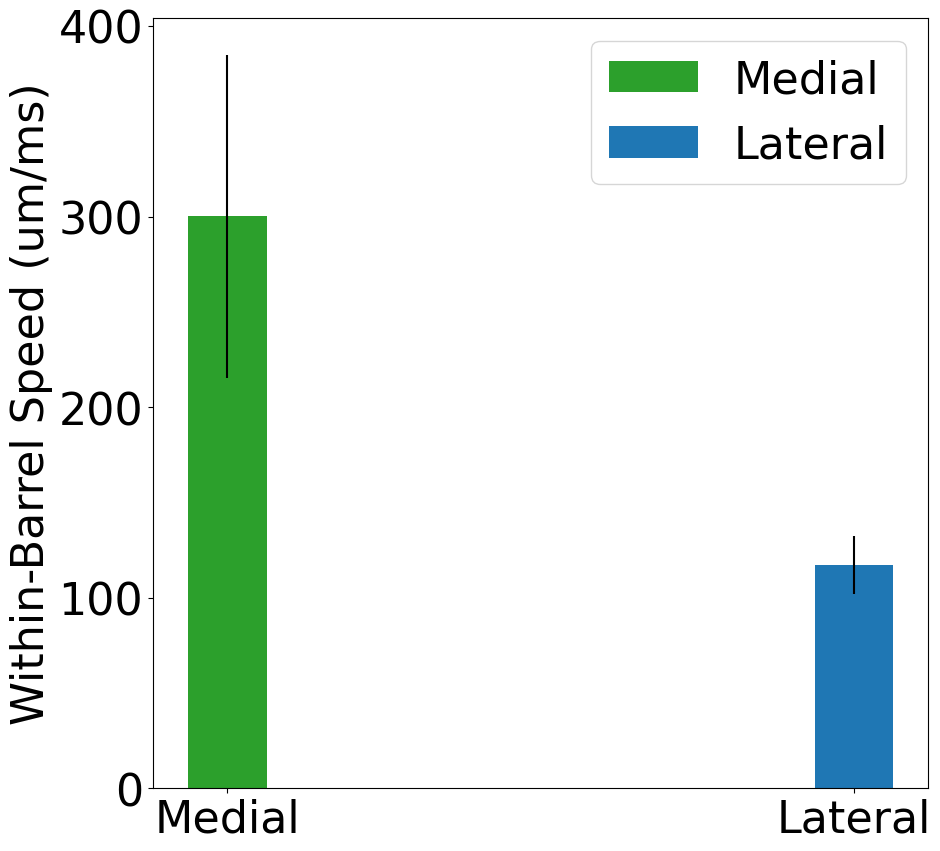

In [47]:
# compare medial vs lateral: speed



fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot speeds for ladder_df, split into L2/3 and L4, and only for neighbor barrels (ROI > 1) in ACSF
directions = ['Medial', 'Lateral']
handles = []

for i, direction in enumerate(directions):
    color = 'tab:blue' if direction == 'Lateral' else 'tab:green'
    direction_df = ladder_df[(ladder_df['Layer'] == 'L4') & 
                                #(ladder_df['drug'] == 'ACSF') & 
                                (ladder_df['ROI'] > 1) & 
                                (ladder_df['Medial/Lateral'] == direction)]
    # plot the data
    l1 = ax.bar(i, 
                    np.mean(np.abs(direction_df["instantaneous_velocity"])), 
                    yerr=sem(np.abs(direction_df["instantaneous_velocity"])), 
                    width=.125,
                    color=color, label=direction)
    handles.append(l1)

# legend: Lateral in blue, Medial in green
ax.legend(handles=[handles[0], handles[-1]], labels=['Medial', 'Lateral'], loc='upper right')

ax.set_ylabel('Within-Barrel Speed (um/ms)')
ax.set_xticks([0, 1])
ax.set_xticklabels(['Medial', 'Lateral'])

# significance testing Medial vs Lateral
med = ladder_df[(ladder_df['Layer'] == 'L4') & 
                                #(ladder_df['drug'] == 'ACSF') & 
                                (ladder_df['ROI'] > 1) & 
                                (ladder_df['Medial/Lateral'] == 'Medial')]["instantaneous_velocity"]

lat = ladder_df[(ladder_df['Layer'] == 'L4') &
                                #(ladder_df['drug'] == 'ACSF') &
                                (ladder_df['ROI'] > 1) &
                                (ladder_df['Medial/Lateral'] == 'Lateral')]["instantaneous_velocity"]

# filter out nans from med and lat
med = [s for s in list(np.abs(med)) if not np.isnan(s)]
lat = [s for s in list(np.abs(lat)) if not np.isnan(s)]

print(list(med), "\n", list(lat))

t_stat, p_val = ttest_ind(med, lat, alternative='greater', equal_var=False)
print("p =", p_val)

# errorbars
ax.errorbar(0, np.mean(med), yerr=sem(med), fmt='', color='black')
ax.errorbar(1, np.mean(lat), yerr=sem(lat), fmt='', color='black')


plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/velocity_medial_lateral.png')
plt.show()


In [48]:
# now let's repeat the same analysis for L2/3 readout
# read in the supragranular data
supra_dir = "C:/Users/jjudge3/Desktop/Data/crossing_PPR/export_summary_supragranular.csv"
supra_df = pd.read_csv(supra_dir)
supra_df['latency'] -= 48.6

# reformat Dat to match the format of the hw/lat/amp data
supra_df['Date'] = supra_df['Date'].apply(lambda x: x.replace('-', '/'))
# convert from m/d/yy to m/d/yyyy
supra_df['Date'] = supra_df['Date'].apply(lambda x: x[:-2] + '20' + x[-2:])

# merge with crossing_data to get the 'Medial/Lateral', 'Layer', and 'drug' columns. 
# append _supra to column names in the supra_df
hw_lat_df_metadata = hw_lat_df[['Date', 'Slice', 'Recording', 'Location', 'Layer', 'drug', 'Medial/Lateral']]
supra_df = supra_df.merge(hw_lat_df_metadata, on=['Date', 'Slice', 'Location', 'Recording'])

supra_df

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,Layer,drug,Medial/Lateral
0,1,0.457087,32.53260,1.7484,10.68250,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
1,1,0.457087,32.53260,1.7484,10.68250,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
2,2,0.274570,10.66380,2.3245,11.36730,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
3,2,0.274570,10.66380,2.3245,11.36730,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
4,1,0.911748,19.74610,1.8831,8.93258,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,NBQX,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,2,4.646450,21.31610,3.9587,18.61850,205.406913,76.285714,40.857143,2_rois_supragranular,12/20/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,ACSF,Lateral
124,1,4.884740,22.38250,3.6901,7.39750,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,NaN
125,1,4.884740,22.38250,3.6901,7.39750,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,Lateral
126,2,2.450560,8.86932,3.3752,11.95010,205.406913,76.285714,40.857143,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,NaN


c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


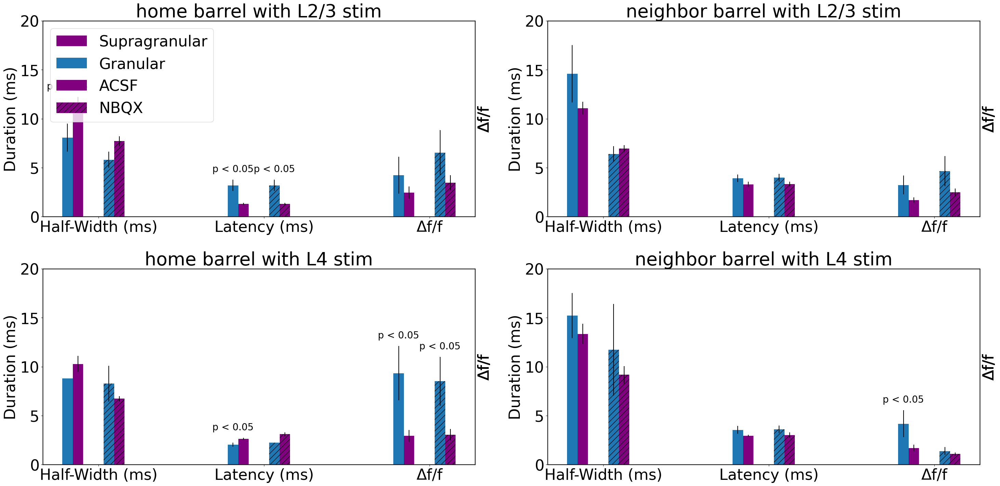

In [49]:
# compare the supra data (supra_df) to the L4 data (hw_lat_df):
#       for ACSF and NBQX, and for L2/3 and L4 stim, and for home versus neighbor
# leave out Medial/Lateral comparison for now
# do latency, half-width, amplitude, comparing supra to L4, for all four of the following plots:
#  - plot 1 home barrel in L4 stim: ACSF vs NBQX
#  - plot 2 neighbor barrel in L4 stim: ACSF vs NBQX
#  - plot 3 home barrel in L2/3 stim: ACSF vs NBQX
#  - plot 4 neighbor barrel in L2/3 stim: ACSF vs NBQX
fig, ax = plt.subplots(2, 2, figsize=(30, 15))

# plot 1 home barrel in L4 stim: ACSF vs NBQX
layers = ['L2/3', 'L4']
drug = ['ACSF', 'NBQX']
home_neighbor = ['home', 'neighbor']
regions = ['Supragranular', 'Granular']
metrics = ['halfwidth', 'latency', 'amp']
handles = ['', '', '', '']
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        for k, home in enumerate(home_neighbor):
            region_dfs = []
            for m, region in enumerate(regions):
                df = supra_df if region == 'Supragranular' else hw_lat_df
                hatch = '//' if d == 'NBQX' else None
                color = 'purple' if region == 'Supragranular' else 'tab:blue'
                
                region_df = df[(df['Layer'] == layer) & 
                                    (df['drug'] == d)]
                if home == 'home':
                    region_df = region_df[region_df['ROI'] == 1]
                else:
                    region_df = region_df[region_df['ROI'] > 1]
                region_dfs.append(region_df)

                for l, metric in enumerate(['halfwidth', 'latency', 'amp']):
                    h = ax[i][k].bar(l + j/4 - 1/8 - 1/16 * m, 
                                    np.mean(region_df[metric]), 
                                    yerr=sem(region_df[metric]), 
                                    width=.125 / 2,
                                    color=color, label=region, hatch=hatch)
                    ax[i][k].set_xticks([0, 1, 2])
                    ax[i][k].set_xticklabels(['Half-Width (ms)', 'Latency (ms)', 'Δf/f'])
                    ax[i][k].set_ylabel('Duration (ms)' )
                    # label other side as Δf/f
                    ax2 = ax[i][k].twinx()
                    ax2.set_ylabel('Δf/f')
                    ax2.set_yticks([])
                    ax[i][k].set_title(home + ' barrel' + ' with ' + layer + ' stim')
                    ax[i][k].set_ylim(0, 20)

                    if d == 'ACSF':
                        if region == 'Supragranular':
                            handles[0] = h
                        else:
                            handles[1] = h
                    if region == 'Supragranular':
                        if d == 'ACSF':
                            handles[2] = h
                        else:
                            handles[3] = h

            # significance testing: supragranular home vs neighbor barrel
            for l, metric in enumerate(['halfwidth', 'latency', 'amp']):
                t_stat, p_val = ttest_ind(region_dfs[0][metric], region_dfs[1][metric])
                height = max(region_dfs[0][metric].mean() + sem(region_dfs[0][metric]), 
                                region_dfs[1][metric].mean() + sem(region_dfs[1][metric])) + 0.2
                if p_val < 0.05:
                    ax[i][k].text(l + j/4 - 1/8 - 1/16, height + .6, 'p < 0.05', ha='center', fontsize=20)
                

# legend in top left, but with only the first two labels
ax[0][0].legend(handles=handles, labels=regions + drug, loc='upper left')
plt.tight_layout()
plt.savefig(output_fig_dir + 'supra_vs_L4.png')
plt.show()


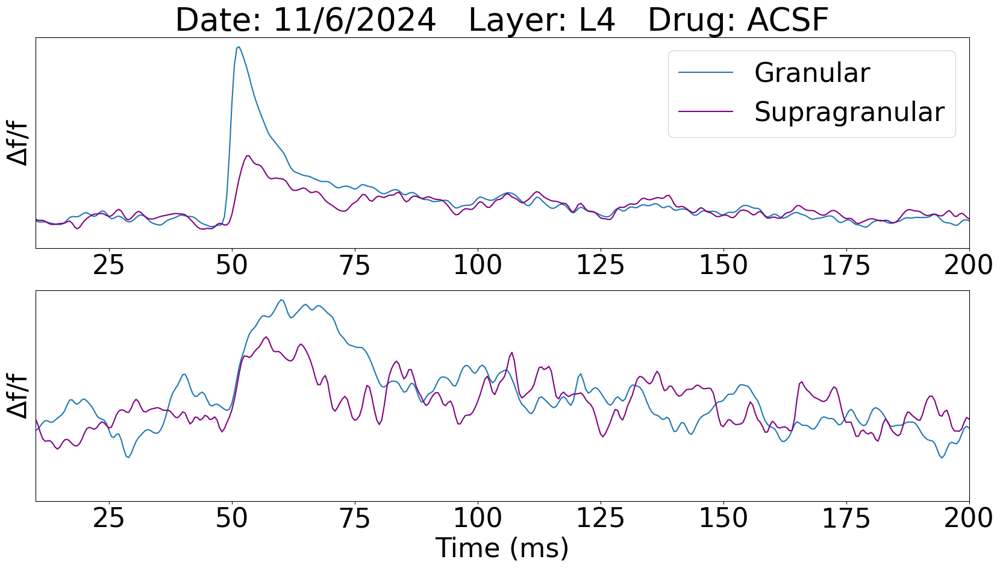

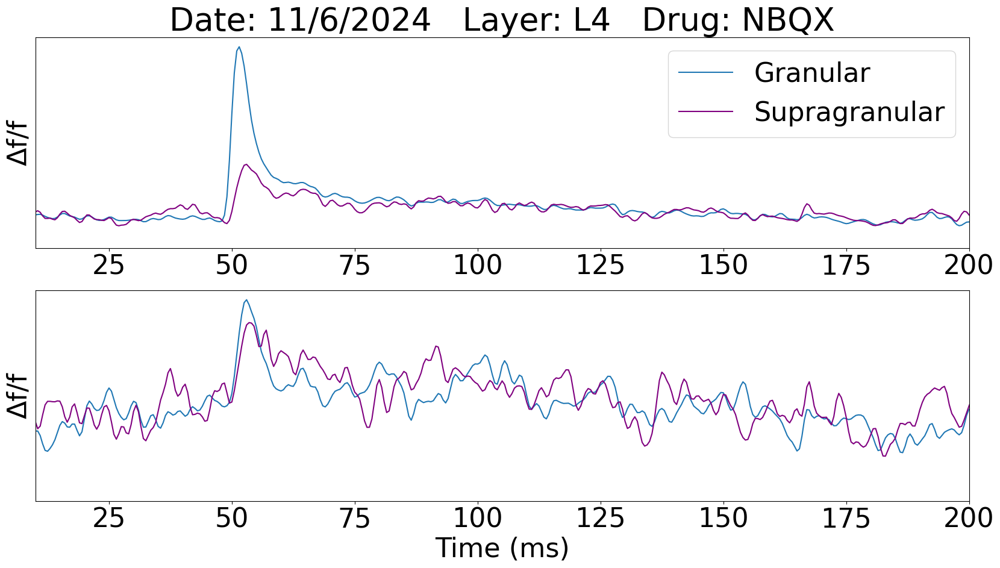

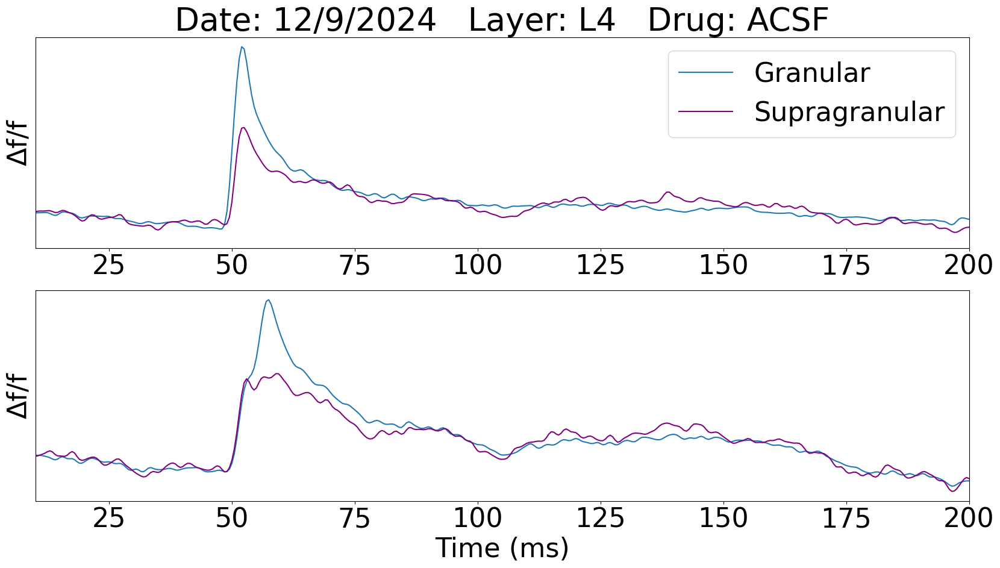

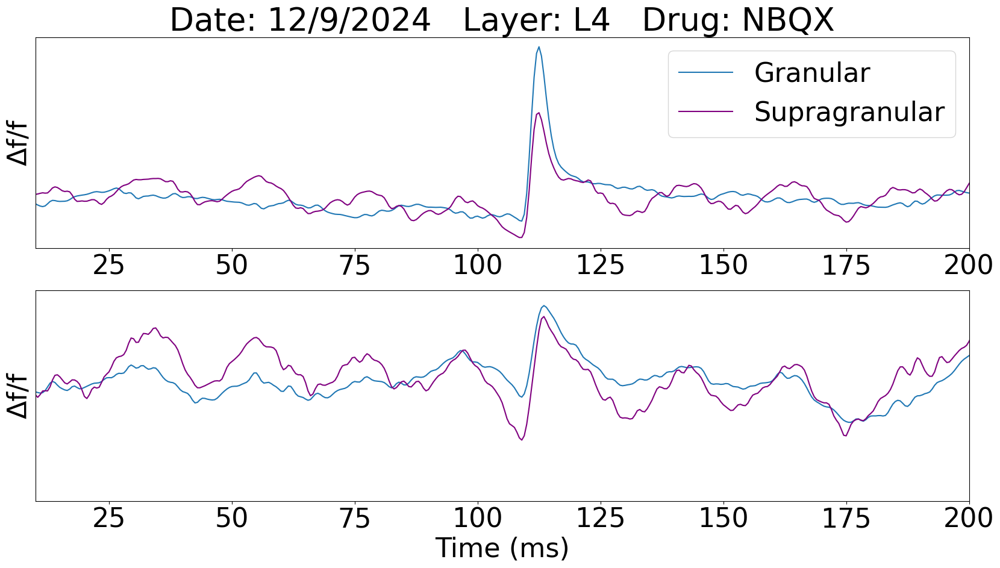

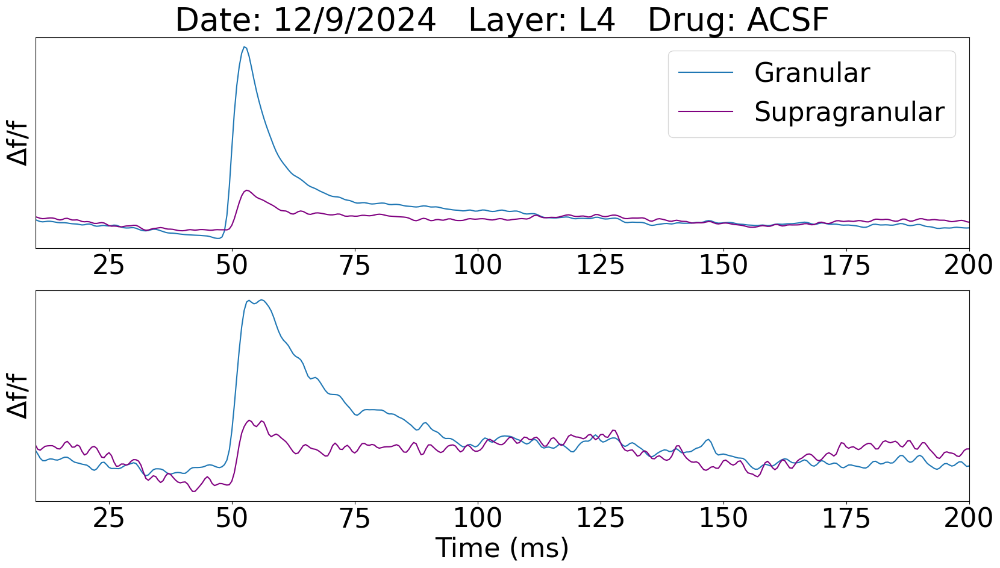

...

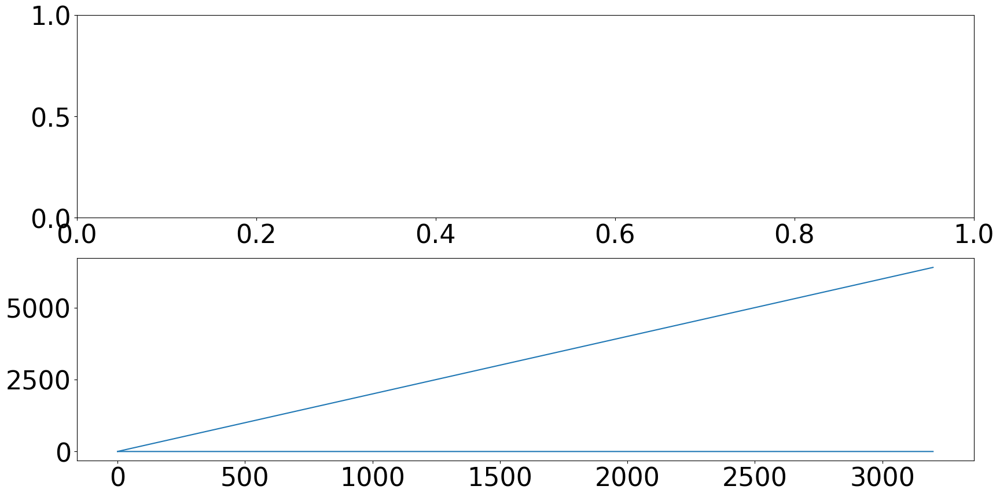

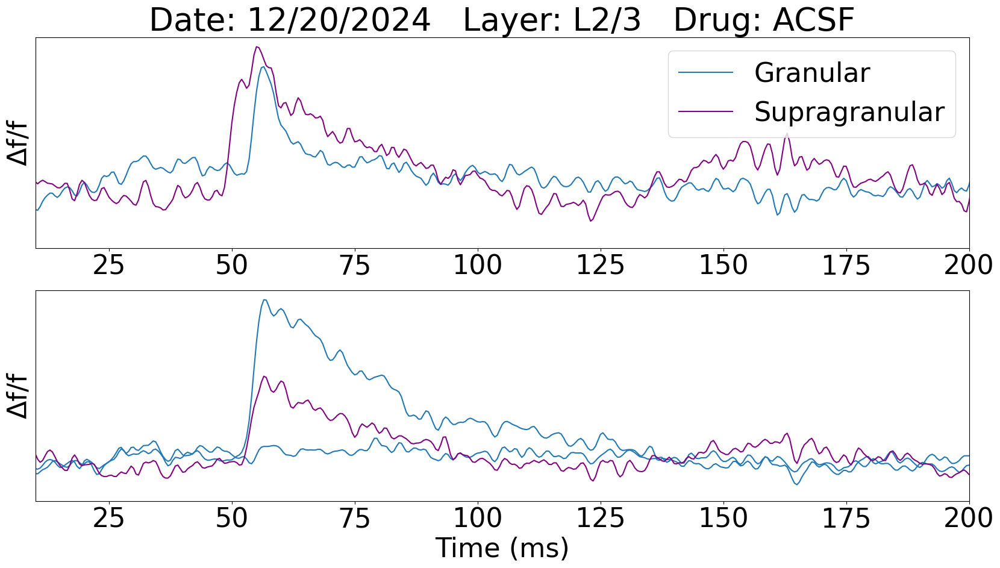

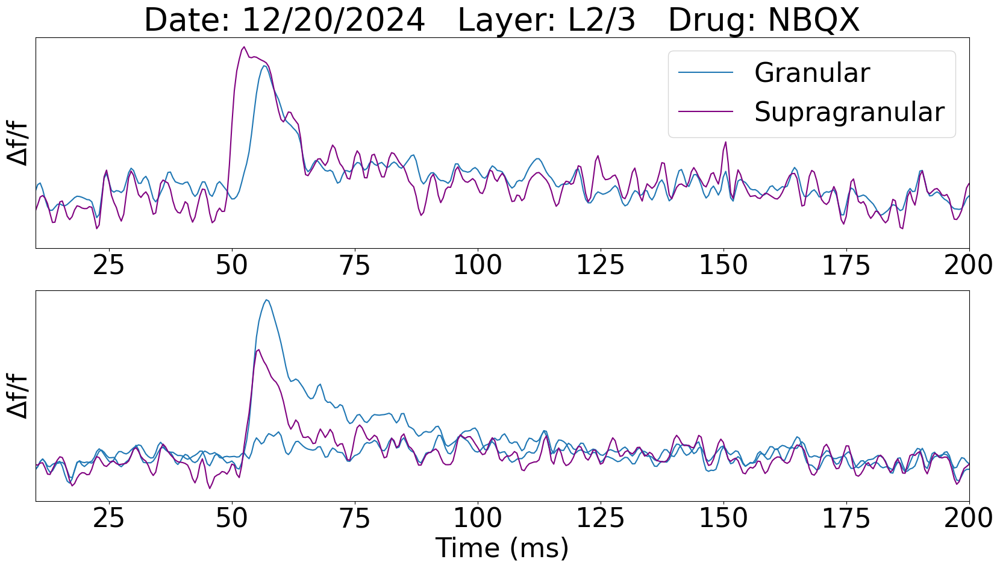

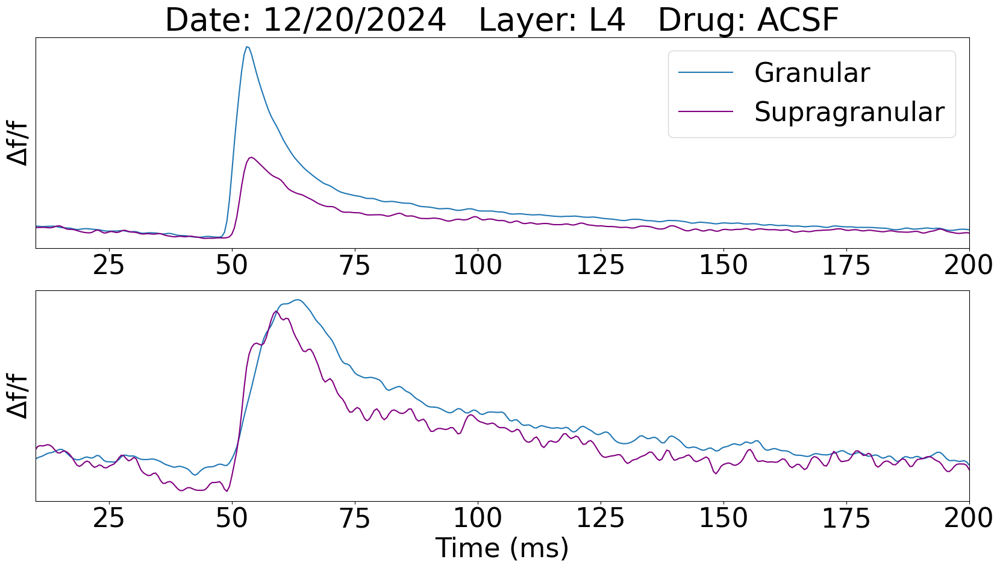

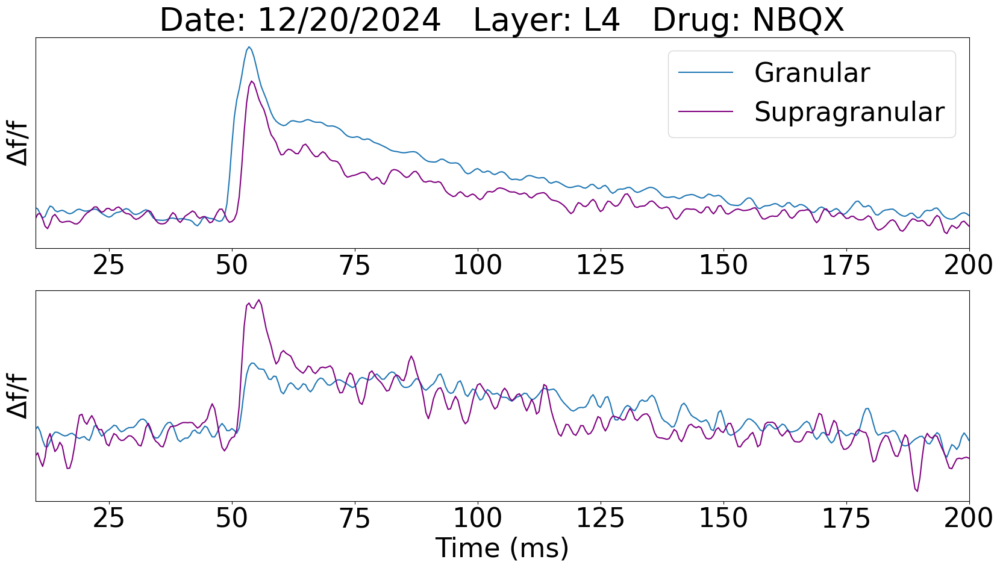

In [50]:
# compare supragranular traces to granular (L4) traces.
# for each layer and drug, compare supragranular to granular for home and neighbor barrels, plotting them in the same plot.

for date in supra_df['Date'].unique():
    date_df = supra_df[supra_df['Date'] == date]
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            for rec in loc_df['Recording'].unique():
                rec_df = loc_df[loc_df['Recording'] == rec]

                # get the layer and drug
                layer = rec_df['Layer'].values[0]
                drug = rec_df['drug'].values[0]

                # get the trace file
                supra_trace = rec_df['trace']
                # read in the trace
                supra_trace = read_dat_trace_file(supra_trace.values[0])

                # get the granular trace
                granular_df = hw_lat_df[(hw_lat_df['Date'] == date) &
                                        (hw_lat_df['Slice'] == slic) &
                                        (hw_lat_df['Location'] == loc) &
                                        (hw_lat_df['Recording'] == rec)]
                if granular_df.empty:
                    continue
                granular_trace = granular_df['trace']
                try:
                    granular_trace = read_dat_trace_file(granular_trace.values[0])
                except FileNotFoundError:
                    continue

                # plot the traces
                fig, ax = plt.subplots(2, 1, figsize=(20, 10))
                cols = supra_trace.columns
                if len(granular_trace.columns) < len(cols):
                    cols = granular_trace.columns

                for i, roi in enumerate(granular_trace.columns):
                    if roi == 'Pt':
                        continue
                    t = np.arange(0, len(granular_trace[roi]) * 0.5, 0.5)
                    i_plot = 0 if roi == "ROI1" else 1
                    ax[i_plot].plot(t, granular_trace[roi], color='tab:blue')
                    #base += granular_trace[roi].max() + 0.1
                for i, roi in enumerate(supra_trace.columns):
                    if roi == 'Pt':
                        continue
                    try:
                        t = np.arange(0, len(granular_trace[roi]) * 0.5, 0.5)
                    except KeyError:
                        continue
                    i_plot = 0 if roi == "ROI1" else 1
                    ax[i_plot].plot(np.arange(0, len(supra_trace[roi]) * 0.5, 0.5), supra_trace[roi], color='purple')
                    #base += supra_trace[roi].max() + 0.1
                        
                    ax[0].legend(loc='upper right', labels=['Granular', 'Supragranular'])
                    # label date, slice, loc, rec, layer, drug
                    ax[0].set_title('Date: ' + date + '   Layer: ' + layer + '   Drug: ' + drug)
                    ax[0].set_ylabel('Δf/f')
                    ax[1].set_ylabel('Δf/f')
                    ax[0].set_yticks([])
                    ax[1].set_yticks([])
                    ax[0].set_xlim(10, 200)
                    ax[1].set_xlim(10, 200)
                    ax[1].set_xlabel('Time (ms)')
                plt.savefig(output_fig_dir + date.replace('/', '-') + '_' + str(slic) + '_' + str(loc) + '_' + str(rec) + '.png')
                plt.show()


In [51]:
# load PPR data and take just the first-pulse rows for IPI = 100 to use as more single-pulse data (medial/lateral)
ppr_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/export_summary_backup_coronal.csv'
ppr_coronal_df = pd.read_csv(ppr_data)
ppr_coronal_df['latency'] -= 78.78  # measured via PhotoZ for IPI == 100 pulse 1
# load PPR catalog
ppr_catalog = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/ppr_catalog_backup-coronal-only.csv'
ppr_catalog_df = pd.read_csv(ppr_catalog)

# only keep zda_file, IPI, and is_single_pulse_control columns
ppr_catalog_df = ppr_catalog_df[['zda_file', 'IPI', 'is_single_pulse_control']]

# parse slice, location, and recording numbers from zda_file and store in new columns
ppr_catalog_df['zda_id'] = ppr_catalog_df['zda_file'].apply(lambda x: x.split('/')[-1].split('.')[0])
ppr_catalog_df['Slice'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[0]))
ppr_catalog_df['Location'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[1]))
ppr_catalog_df['Recording'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[2]))

# parse date from zda_file column. It is in format "/mm-dd-yy/", use pattern matching to extract date (regex)
# Function to extract date using regex
def extract_date(filename):
    match = re.search(r'(\d{2}-\d{2}-\d{2})', filename)
    if match:
        # remove zero padding from day and month
        m,d,y = match.group(0).split('-')
        d = str(int(d))
        m = str(int(m))
        return f"{m}/{d}/20{y}"
    return None

ppr_catalog_df['Date'] = ppr_catalog_df['zda_file'].apply(extract_date)

# merge the two dataframes, using date, slice, location, and recording as keys
ppr_coronal_df = ppr_coronal_df.merge(ppr_catalog_df, on=['Date', 'Slice', 'Location', 'Recording'])

# drop the zda_file column
ppr_coronal_df.drop('zda_file', axis=1, inplace=True)

# only keep the first pulse for IPI = 100 and single pulse controls only
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['is_single_pulse_control'] == 1]
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['IPI'] == 100]

# keep only with substring 'pulse1' in the 'ROI_Set' column
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['ROI_Set'].str.contains('pulse1')]

# filter out columns with Home in Medial/Lateral
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['Medial/Lateral'] != 'Home']

# remove rows with negative halfwidth or latency
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['halfwidth'] > 0]
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['latency'] > 0]

# add Layer column and fill with 'L4'
ppr_coronal_df['Layer'] = 'L4'
ppr_coronal_df['drug'] = 'ACSF'

# to avoid double counts, remove rows from Date == ['12/18/2024' '12/20/2024']
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['Date'] != '12/18/2024']
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['Date'] != '12/20/2024']

ppr_coronal_df



,ROI,amp,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,trace_non_polyfit,amp_array,Medial/Lateral,IPI,is_single_pulse_control,zda_id,Layer,drug
91,2,2.432550,5.5113,18.3610,53.121780,52.351288,2_rois pulse1,1/2/2025,2,2,5,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,100,1,02_02_05,L4,ACSF
187,2,1.856520,3.6446,16.8169,53.754098,48.061475,1_rois pulse1,1/7/2025,1,2,11,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,01_02_11,L4,ACSF
311,2,1.800210,3.2945,11.9526,60.164021,62.899471,2_rois pulse1,1/7/2025,2,5,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,02_05_26,L4,ACSF
385,2,1.992990,3.9166,26.4890,30.245370,50.333333,3_rois-3-barrels pulse1,1/7/2025,3,2,13,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,100,1,03_02_13,L4,ACSF
386,3,1.526330,4.5569,29.9288,70.971264,22.959770,3_rois-3-barrels pulse1,1/7/2025,3,2,13,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,03_02_13,L4,ACSF
515,2,2.797810,4.1902,15.5445,52.301075,60.688172,4_rois pulse1,1/7/2025,4,2,16,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,04_02_16,L4,ACSF
1030,2,0.749263,2.8437,16.8471,45.560403,52.040268,1_rois pulse1,12/23/2024,1,3,11,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,100,1,01_03_11,L4,ACSF


Medial: 7
Lateral: 8


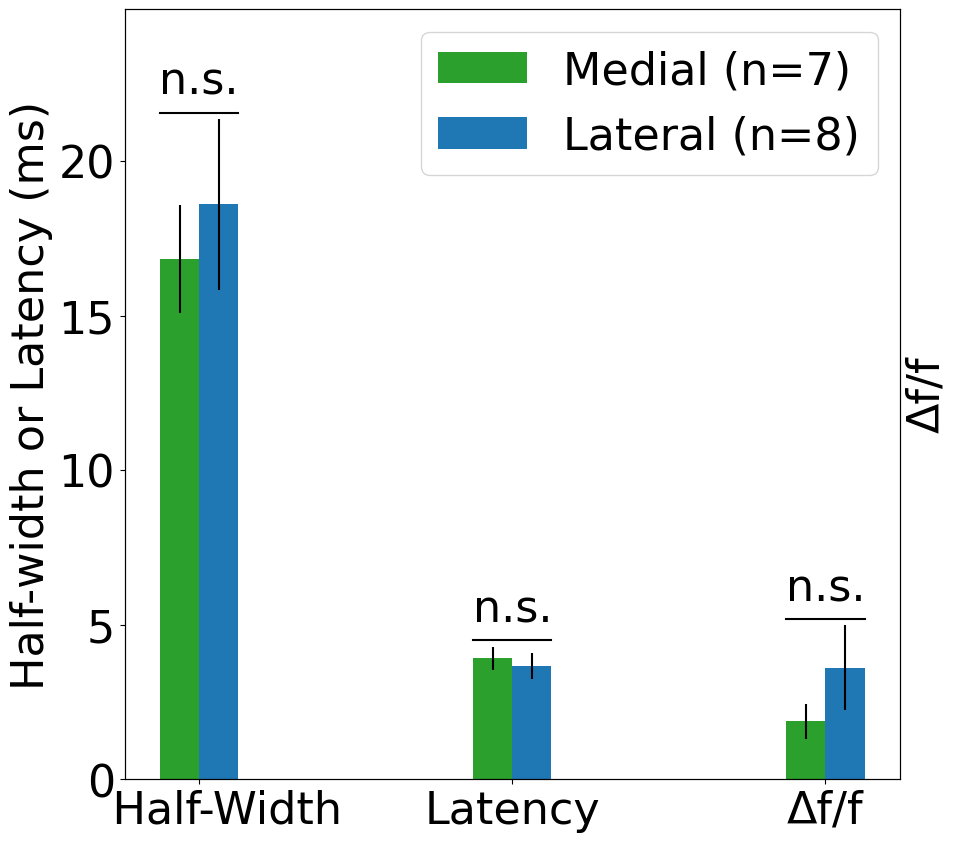

In [52]:


# plot the data that has 'Medial/Lateral' column populated. Restrict to L4 and ACSF and neighbor barrels (ROI > 1)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot only for L4, not for L2/3. Compare latency, half-width, and amplitude for medial vs lateral neighbor barrels
directions = ['Medial', 'Lateral']
handles = []

sample_sizes = {dir: [] for dir in directions}
for i, direction in enumerate(directions):
    color = 'tab:blue' if direction == 'Lateral' else 'tab:green'
    for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
        # get the data for the direction
        direction_list = []
        for df in [hw_lat_df, ppr_coronal_df]:
            direction_df = df[(df['Layer'] == 'L4') & 
                                    (df['drug'] == 'ACSF') & 
                                    (df['ROI'] > 1) & 
                                    (df['Medial/Lateral'] == direction)]
            direction_list += list(direction_df[metric])
        direction_list = np.array(direction_list)
        # plot the data
        l1 = ax.bar(j + i / 8 - 1/16, 
                        np.mean(direction_list), 
                        yerr=sem(direction_list), 
                        width=.125,
                        color=color, label=direction)
        handles.append(l1)

        if j == 0:
            # print sample size for each direction
            print(direction + ':', len(direction_list))
            sample_sizes[direction].append(len(direction_list))

# legend: Medial in black, Lateral in green
ax.legend(handles=[handles[0], handles[-1]], labels=['Medial (n=' + str(sum((sample_sizes['Medial']))) + ")", 
                                                     'Lateral (n=' + str(sum((sample_sizes['Lateral']))) + ")"], 
                                            loc='upper right')

ax.set_ylabel('Half-width or Latency (ms)')
# right-side y-axis label
ax2 = ax.twinx()
ax2.set_ylabel('Δf/f')
ax2.set_yticks([])

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['    Half-Width', 'Latency', 'Δf/f'])

# significance testing Medial vs Lateral
for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
    med1 = ppr_coronal_df[(ppr_coronal_df['Layer'] == 'L4') & 
                                        (ppr_coronal_df['drug'] == 'ACSF') & 
                                        (ppr_coronal_df['ROI'] > 1) & 
                                        (ppr_coronal_df['Medial/Lateral'] == 'Medial')][metric]
    lat1 = ppr_coronal_df[(ppr_coronal_df['Layer'] == 'L4') &
                                        (ppr_coronal_df['drug'] == 'ACSF') &
                                        (ppr_coronal_df['ROI'] > 1) &
                                        (ppr_coronal_df['Medial/Lateral'] == 'Lateral')][metric]
    med2 = hw_lat_df[(hw_lat_df['Layer'] == 'L4') &
                                        (hw_lat_df['drug'] == 'ACSF') &
                                        (hw_lat_df['ROI'] > 1) &
                                        (hw_lat_df['Medial/Lateral'] == 'Medial')][metric]
    lat2 = hw_lat_df[(hw_lat_df['Layer'] == 'L4') &
                                        (hw_lat_df['drug'] == 'ACSF') &
                                        (hw_lat_df['ROI'] > 1) &
                                        (hw_lat_df['Medial/Lateral'] == 'Lateral')][metric]
    med = list(med1) + list(med2)
    lat = list(lat1) + list(lat2)
    t_stat, p_val = ttest_ind(med, lat, equal_var=False)
    # draw bar between the two boxes # ax.get_ylim()[1] * 0.8
    med = np.array(med)
    lat = np.array(lat)
    height = max(med.mean() + sem(med), lat.mean() + sem(lat)) + 0.2

    ax.plot([j - 1/8, j + 1/8], [height, height], color='black')
    if p_val < 0.05:
        ax.text(j, height + .6, 'p < 0.05', ha='center')

        
    else:
        ax.text(j, height + .6, 'n.s.', ha='center')

# raise the y-axis limit by 10% to make room for the significance testing
ax.set_ylim(0, ax.get_ylim()[1] * 1.1)


plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/hw_lat_amp_medial_lateral.png')
plt.show()


t-test between home and neighbor: t = 3.102601952078281, p = 0.004563835762071148


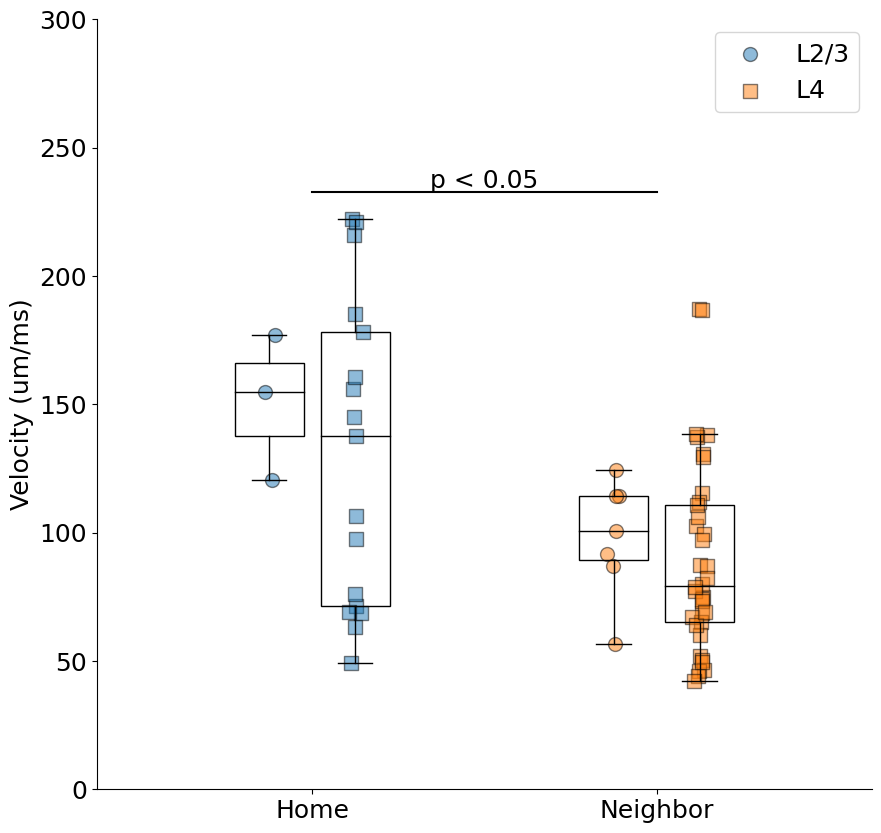

In [53]:
# using C:\Users\jjudge3\Desktop\Data\crossing_PPR\ladder_velocity_regimes.csv,
# plot the velocity distribution for each regime, taking instantaneous velocity from the ladder_df
ladder_regimes_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/ladder_velocity_regimes.csv'
ladder_regimes_df = pd.read_csv(ladder_regimes_data)
# ladder regimes has columns: Date, Slice, Location, Recording, velocity_regime_start, velocity_regime_end, velocity_regime_type

# set fontsize
plt.rcParams.update({'font.size': 18})

regime_velocities = {}
for i, row in ladder_regimes_df.iterrows():
    date, slic, loc, rec = row['Date'], row['Slice'], row['Location'], row['Recording']
    # get the corresponding subset in ladder_df, for drug == 'ACSF'
    ladder_row = ladder_df[(ladder_df['Date'] == date) & 
                            (ladder_df['Slice'] == slic) & 
                            (ladder_df['Location'] == loc) & 
                            (ladder_df['Recording'] == rec) & 
                            (ladder_df['drug'] == 'ACSF')]

    # exclude if Stim_Distance < 50 um
    ladder_row = ladder_row[ladder_row['Stim_Distance'] > 50]
    
    if ladder_row.empty:
        continue

    # the range [velocity_regime_start, velocity_regime_end] corresponds to the Dist_from_home_barrel
    # get the instantaneous velocity for this range

    start = row['velocity_regime_start']
    end = row['velocity_regime_end']

    regime_type = row['velocity_regime_type']

    # get the instantaneous velocity for this range
    regime_df = ladder_row[(ladder_row['Dist_from_home_barrel'] >= start) & 
                            (ladder_row['Dist_from_home_barrel'] <= end)]

    #print(regime_df['instantaneous_velocity'])

    if regime_df.empty:
        continue
    layer = regime_df['Layer'].values[0]
    #print(layer)

    if regime_type not in regime_velocities:
        regime_velocities[regime_type] = {}
    if layer not in regime_velocities[regime_type]:
        regime_velocities[regime_type][layer] = []
    
    # filter outliers > 700 um/ms and -700 um/ms
    regime_df = regime_df[(regime_df['instantaneous_velocity'] < 700) & (regime_df['instantaneous_velocity'] > -700)]
    #if regime_type == 'septal':
    #    print(regime_df[['instantaneous_velocity', 'Date', 'Dist_from_home_barrel']])
    avg_vel = np.mean(np.abs(regime_df['instantaneous_velocity']))

    # outliers
    if avg_vel < 300 and avg_vel > 40:
        regime_velocities[regime_type][layer].append(avg_vel)
    

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

for j, layer in enumerate(['L2/3', 'L4']):
    regimes = []
    for i, regime_type in enumerate(['home', 'neighbor']): #, 'septal']):
        velocities = regime_velocities[regime_type][layer]
        # boxplot for each regime. transparent box, black outline, no outliers
        ax.boxplot(velocities, positions=[i + j * 0.25 - 0.125], widths=0.2, patch_artist=True, 
                    boxprops=dict(facecolor='none', color='black'), 
                    showfliers=False, medianprops=dict(color='black'))

        x_jitter = np.random.normal(0, 0.01, len(velocities))
        ax.scatter(x_jitter + i + j * 0.25 - 0.125, velocities,
                     alpha=0.5, color=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                     edgecolors='black', s=100, marker=('o' if layer == 'L2/3' else 's'), label=layer)
        regimes.append(regime_type)

# significance testing between regimes
for i_ in range(len(regimes)):
    for j_ in range(i_ + 1, len(regimes)):
        regime1 = regime_velocities[regimes[i_]]['L2/3'] + regime_velocities[regimes[i_]]['L4']
        regime2 = regime_velocities[regimes[j_]]['L2/3'] + regime_velocities[regimes[j_]]['L4']
        t_stat, p_val = ttest_ind(regime1, regime2, equal_var=False)
        print(f"t-test between {regimes[i_]} and {regimes[j_]}: t = {t_stat}, p = {p_val}")
        if 'home' in [regimes[i_], regimes[j_]] and 'septal' in [regimes[i_], regimes[j_]]:
            continue  # don't show significance testing between home and septal
        if p_val < 0.05:
            ax.text((i_ + j_) / 2, max(max(regime1), max(regime2)) + 12, 'p < 0.05', ha='center')

            # draw line between the two boxes
            ax.plot([i_, j_], [max(max(regime1), max(regime2)) + 10.5, max(max(regime1), max(regime2)) + 10.5], color='black')
        
ax.set_xticks(range(len(regimes)))
ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Velocity (um/ms)')

ax.set_ylim(0, 300)

# turn off spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# legend: only first 2 handles
handles = [ax.get_children()[0], ax.get_children()[3]]
ax.legend(handles=handles, labels=['L2/3', 'L4'], loc='upper right')

plt.savefig('P:/John/crossing-paper/input/ladder_velocity_regimes.png')


## 